# AirBNB NYC Property Clustering - Exploratory Data Analysis

## Springboard Data Science Track - Third Capstone - Travis Martin

In [411]:
# Importing necessary libraries

# Pandas and Numpy for Dataframe operations
# Seaborn and Matplotlib for visualizations
# nltk and WordCloud for Natural Language Processing tasks
# GeoPy for reverse geocoding operations

import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import seaborn as sns
import nltk
nltk.download('punkt')
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.probability import FreqDist
import os
import sys
from collections import Counter
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.stem.wordnet import WordNetLemmatizer
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import re
from pandas_profiling import ProfileReport

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [412]:
# Loading cleaned dataset from the Data Wrangling notebook to Pandas Dataframe
df_NYC = pd.read_csv('D://Springboard/ThirdCapstone/RawData/cleaned_df.csv')
df_NYC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16242 entries, 0 to 16241
Data columns (total 67 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       16242 non-null  float64
 1   log_price                16242 non-null  float64
 2   property_type            16242 non-null  object 
 3   room_type                16242 non-null  object 
 4   amenities                16242 non-null  object 
 5   accommodates             16242 non-null  float64
 6   bathrooms                16242 non-null  float64
 7   bed_type                 16242 non-null  object 
 8   cancellation_policy      16242 non-null  object 
 9   cleaning_fee             16242 non-null  int64  
 10  city                     16242 non-null  object 
 11  description              16242 non-null  object 
 12  host_has_profile_pic     16242 non-null  int64  
 13  host_identity_verified   16242 non-null  int64  
 14  host_response_rate    

After finishing the process of cleaning and organizing our data in the data wrangling step, we've now got a new clean dataset loaded to a Pandas dataframe. It's just over 16K rows of Airbnb property data from NYC, and the columns are a mix of ints, floats, and strings (objects).

The first few tasks for this Exploratory Data Analysis portion all relate to the text contained in the string columns. Much like we variable-ized the listed amenities in the last step, we'll now be doing something similar with the descriptions. The difference, however, is that the descriptions are fully user-created as opposed to selected from a set list, which considerably increases the difficulty of pulling useful information from them. Luckily we have access to Natural Language Processing (NLP) tools in Python like nltk. We'll be leaning on this library heavily in the early part of this process.

First things first, we want to remove letter case (upper or lower) as a consideration for processing our text down into words. Luckily Pandas has a string operator called .lower() which automatically converts all letters in a string to lower-case.

In [413]:
df_NYC['description'] = df_NYC['description'].str.lower()

Next, we need to break our description, which exists as one long string, down into a list of component words. This process is called *tokenization*, and nltk is able to perform this task directly using nltk.word_tokenize.

In [414]:
df_NYC['tokenized_desc'] = df_NYC.apply(lambda row: nltk.word_tokenize(row['description']), axis=1)
df_NYC.head()

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,Private_LR,Pool,Smart lock,BBQ grill,Crib,days_since_first_review,avg_mthly_rev,days_since_host_start,has_url,tokenized_desc
0,6901257.0,5.010635,Apartment,Entire home/apt,"""Wireless Internet"",""Air conditioning"",Kitchen...",3.0,1.0,Real Bed,strict,1,...,0,0,0,0,0,472,0.126850,2017,1,"[beautiful, ,, sunlit, brownstone, 1-bedroom, ..."
1,6304928.0,5.129899,Apartment,Entire home/apt,"""Wireless Internet"",""Air conditioning"",Kitchen...",7.0,1.0,Real Bed,strict,1,...,0,0,0,0,0,59,3.000000,106,1,"[enjoy, travelling, during, your, stay, in, ma..."
2,7919400.0,4.976734,Apartment,Entire home/apt,"TV,""Cable TV"",""Wireless Internet"",""Air conditi...",5.0,1.0,Real Bed,moderate,1,...,0,0,0,0,0,156,1.910828,343,1,"[the, oasis, comes, complete, with, a, full, b..."
3,17589436.0,4.882802,Apartment,Entire home/apt,"TV,""Cable TV"",Internet,""Wireless Internet"",""Ai...",2.0,1.0,Real Bed,strict,1,...,0,0,0,0,0,738,1.055480,778,0,"[i, am, renting, a, very, spacious, ,, unique,..."
4,18224863.0,4.595120,House,Entire home/apt,"TV,""Wireless Internet"",""Air conditioning"",Kitc...",8.0,1.0,Real Bed,strict,1,...,0,0,0,0,0,65,2.272727,147,1,"[huge, 3, bedroom, apartment, situated, in, fl..."


As we see in the results table above, we now have a new column called "tokenized_desc", wherein each row contains a list of all of its Description words separated by commas.

The next step is a bit more complicated. We want to be able to treat all different forms of a root word as the same word (ex: ride, rides, riding, etc.). This process is called *lemmatization*, and again nltk has a built in function for it called .lemmatize.

We'll create a new function to iterate over each of the words lists in the tokenized_desc column and return a new column with a condensed list of words.

In [415]:
# Creating a function to iterate through a tokenized list of words
def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
    return [lemmatizer.lemmatize(w) for w in text]

# Applying the lemmatizer to our tokenized description column
df_NYC['lemmatized_desc'] = df_NYC['tokenized_desc'].apply(lemmatize_text)
df_NYC.head()

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,Pool,Smart lock,BBQ grill,Crib,days_since_first_review,avg_mthly_rev,days_since_host_start,has_url,tokenized_desc,lemmatized_desc
0,6901257.0,5.010635,Apartment,Entire home/apt,"""Wireless Internet"",""Air conditioning"",Kitchen...",3.0,1.0,Real Bed,strict,1,...,0,0,0,0,472,0.126850,2017,1,"[beautiful, ,, sunlit, brownstone, 1-bedroom, ...","[beautiful, ,, sunlit, brownstone, 1-bedroom, ..."
1,6304928.0,5.129899,Apartment,Entire home/apt,"""Wireless Internet"",""Air conditioning"",Kitchen...",7.0,1.0,Real Bed,strict,1,...,0,0,0,0,59,3.000000,106,1,"[enjoy, travelling, during, your, stay, in, ma...","[enjoy, travelling, during, your, stay, in, ma..."
2,7919400.0,4.976734,Apartment,Entire home/apt,"TV,""Cable TV"",""Wireless Internet"",""Air conditi...",5.0,1.0,Real Bed,moderate,1,...,0,0,0,0,156,1.910828,343,1,"[the, oasis, comes, complete, with, a, full, b...","[the, oasis, come, complete, with, a, full, ba..."
3,17589436.0,4.882802,Apartment,Entire home/apt,"TV,""Cable TV"",Internet,""Wireless Internet"",""Ai...",2.0,1.0,Real Bed,strict,1,...,0,0,0,0,738,1.055480,778,0,"[i, am, renting, a, very, spacious, ,, unique,...","[i, am, renting, a, very, spacious, ,, unique,..."
4,18224863.0,4.595120,House,Entire home/apt,"TV,""Wireless Internet"",""Air conditioning"",Kitc...",8.0,1.0,Real Bed,strict,1,...,0,0,0,0,65,2.272727,147,1,"[huge, 3, bedroom, apartment, situated, in, fl...","[huge, 3, bedroom, apartment, situated, in, fl..."


The length (in words) of our user-generated descriptions could also be a useful piece of clustering information for us, so we'll now add a new 'desc_length' column as well.

In [416]:
# Creating a new column counting the # of words in each description
df_NYC['desc_length'] = df_NYC.apply(lambda row: len(row['lemmatized_desc']), axis=1)
df_NYC['desc_length'].unique()

array([ 36, 185, 195, 214, 143, 204,  35, 201,  72,  34,  47,  68,  41,
       179, 202,  84, 208, 102, 220, 207,  42, 192, 103, 194,  50,  65,
       163, 145,  44, 180, 191,  45, 115,  90, 158, 206, 140, 175,   3,
       210, 199,  33, 135, 111, 203, 136, 105, 181, 123,  82, 190,   8,
       205, 188, 198,  29,  53,  78, 196, 212, 197,  79, 193, 228, 177,
       187,  51,  88,  81, 176,  77, 182, 184,  56, 200, 209, 178,  52,
        54,  69, 112,  60,  19,  46, 189, 174,  96,  61,  43, 211, 223,
        26, 117, 127, 119,  85,  27,  83,  17, 224, 144, 170, 219, 213,
        63, 152,  57,  93,  48, 150,  21, 121, 113,  87, 166,  95, 165,
        94, 173,  49, 142,  97, 149, 100, 129,  92,  64, 215, 169, 218,
        13,  38, 157, 124, 108,  98, 153,  40, 232, 161,  59, 183, 227,
        37,  86,  91, 160, 133, 186, 139, 164,  67, 138,  66, 106,  28,
       146, 216, 217, 110, 107,  99, 130, 162,  58, 159,  71, 226,  89,
        22, 116,  74, 101,   9, 172,  30,  39, 126, 137, 171,   

While description is likely going to be our most useful text column, 'Name' is user-generated as well, and could also contain relevant information. As such, we'll run the tokenizer and the word_count operations on this column as well.

In [417]:
# Running tokenizaation on the name column
df_NYC['tokenized_name'] = df_NYC.apply(lambda row: nltk.word_tokenize(row['name']), axis=1)

# Creating a new column counting the # of words in each property name
df_NYC['name_length'] = df_NYC.apply(lambda row: len(row['tokenized_name']), axis=1)

df_NYC.head()

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,Crib,days_since_first_review,avg_mthly_rev,days_since_host_start,has_url,tokenized_desc,lemmatized_desc,desc_length,tokenized_name,name_length
0,6901257.0,5.010635,Apartment,Entire home/apt,"""Wireless Internet"",""Air conditioning"",Kitchen...",3.0,1.0,Real Bed,strict,1,...,0,472,0.126850,2017,1,"[beautiful, ,, sunlit, brownstone, 1-bedroom, ...","[beautiful, ,, sunlit, brownstone, 1-bedroom, ...",36,"[Beautiful, brownstone, 1-bedroom]",3
1,6304928.0,5.129899,Apartment,Entire home/apt,"""Wireless Internet"",""Air conditioning"",Kitchen...",7.0,1.0,Real Bed,strict,1,...,0,59,3.000000,106,1,"[enjoy, travelling, during, your, stay, in, ma...","[enjoy, travelling, during, your, stay, in, ma...",185,"[Superb, 3BR, Apt, Located, Near, Times, Square]",7
2,7919400.0,4.976734,Apartment,Entire home/apt,"TV,""Cable TV"",""Wireless Internet"",""Air conditi...",5.0,1.0,Real Bed,moderate,1,...,0,156,1.910828,343,1,"[the, oasis, comes, complete, with, a, full, b...","[the, oasis, come, complete, with, a, full, ba...",195,"[The, Garden, Oasis]",3
3,17589436.0,4.882802,Apartment,Entire home/apt,"TV,""Cable TV"",Internet,""Wireless Internet"",""Ai...",2.0,1.0,Real Bed,strict,1,...,0,738,1.055480,778,0,"[i, am, renting, a, very, spacious, ,, unique,...","[i, am, renting, a, very, spacious, ,, unique,...",214,"[Amazing, LES, apt, -, cool, ,, bright, ...]",8
4,18224863.0,4.595120,House,Entire home/apt,"TV,""Wireless Internet"",""Air conditioning"",Kitc...",8.0,1.0,Real Bed,strict,1,...,0,65,2.272727,147,1,"[huge, 3, bedroom, apartment, situated, in, fl...","[huge, 3, bedroom, apartment, situated, in, fl...",143,"[3, Bedroom, Apartment, for, Small, Group, or,...",8


While we're calculating list lengths, the amenities column that we operated on in the Data Wrangling step is another good candidate. The step below splits the string every time it encounters a separator (a comma, in this case), and then counts the length of the list of split strings, which is stores in a new column called '#_of_amenities'.

In [418]:
# Creating a new column counting the number of amenities selected for each property
df_NYC['#_of_amenities'] = df_NYC['amenities'].apply(lambda x: len(x.split(',')))
df_NYC['#_of_amenities'].unique()

array([ 9, 15, 19, 18, 24, 44, 21,  8, 14, 17, 16,  1,  6, 13, 11, 10,  7,
        2, 23, 26, 41, 28, 20, 33, 12, 37, 22, 32, 38, 27, 30, 25, 49, 36,
       31, 43, 35,  5, 57, 40, 29, 47,  4, 51,  3, 34, 39, 55, 42, 46, 45,
       58, 62, 70, 52, 61, 50, 53, 59, 60, 56, 54, 48, 64, 71, 63, 77, 69],
      dtype=int64)

Looking at our tokenized and lemmatized description output, you can see that there are strings included that are not words. Instead they're mostly special characters and spaces.

The intent of NLP is to focus only on words that contribute to the intended meaning of the text. These words are the signal, whereas filler words like 'the', 'and', 'of' and so-on can be considered noise. We have at our disposal a built-in library of these filler words (called "stop" words) that will check each word against the list and omit any that matches. We'll load the English stop words library, but conveniently we can also add our own items to it as well. We'll add a list of common special characters to the stop words list, and then use the improved set to filter our tokenized and lemmatized description.

In [419]:
# Initializing the English list of stop words, and then adding special characters to it
stop_words = stopwords.words('english')
newStopWords = [',','.','!','(',')','-','/','--',':',';','...','&','*',"'s'"]
stop_words.extend(newStopWords)

# Filtering out stop words, and creating a list of lists as a result
text_filtered = []
text = df_NYC['tokenized_desc'].values 
for m in text:
    stop_m = [i for i in m if str(i).lower() not in stop_words]
    text_filtered.append(stop_m)
    
lem_filtered = []
lem_text = df_NYC['lemmatized_desc'].values
for m in lem_text:
    stop_m = [i for i in m if str(i).lower() not in stop_words]
    lem_filtered.append(stop_m)
    
# Turning the list of lists into a flat list for frequency distribution
flat_text = []
for sublist in text_filtered:
    for item in sublist:
        flat_text.append(item)

One of the most important measures when performing NLP is word frquency, and a popular way to visualize this is a word cloud, where a word's relative size increases as its frequency in the text increases. 

We can use a Python add-on called WordCloud to generate the kinds of views like the one below. We can see that "New York", "living room", "bedroom", "Central Park", and "apartment" all appear in our collected descriptions most often. 

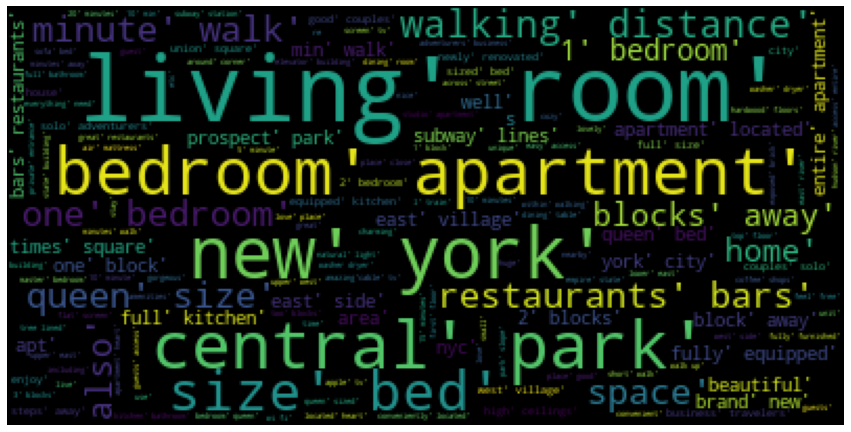

In [420]:
# Creating a word cloud visualization showing relative frequencies of words in the property descriptions.
wordcloud = WordCloud().generate(str(text_filtered))

plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

For a more nuanced look at our text, we can use FreqDist to inspect the frequency distribution of words within it. 

It's worth noting that our output column after stop-word filtering is still technically a list of lists. FreqDist cannot operate on data structured in this nested form, so we've already created a "flattened" list containing all available words in a previous step to perform this operation on instead. 

beautiful:5023
sunlit:72
brownstone:1499
1-bedroom:257
loveliest:13
neighborhood:7077
brooklyn:6614
blocks:5950
promenade:126
bridge:800
park:9607
stunning:369
views:2001
manhattan:8345
great:7581
shopping:2374
food:1247
enjoy:2887
travelling:41
stay:4257
place:6289
centrally:614
located:8411
near:1993
times:2187
square:4697
central:4894
easy:2370
access:6334
main:745
subways:1088
well:2947
walking:3486
distance:3070
many:2406
popular:344
restaurants:9568
bus:1518
tours:28
close:5895
subway:7635
totto:6
ramen:34
hell:348
's:9635
kitchen:11901
ippudo:6
westside:49
empanada:3
mama:14
intrepid:32
sea:34
air:2113
space:6854
museum:1729
three:1207
true:735
bedrooms:2655
one:9273
bathroom:5623
stocked:794
stainless:643
steel:588
appliances:1673
like:2247
keurig:96
machine:527
living:7776
room:10270
spacious:4569
accommodate:686
another:366
person:827
thanks:168
pull:447
bed:10450
top:1527
attractions:781
city:5620
feel:1912
free:2142
explore:547
entire:2636
apartment:25254
worry:75
sharing:1

things:486
abcd:35
christoper:1
meat:77
packing:70
200:61
terrace:774
artistically:16
reflection:13
eclectic:231
upstairs:415
12/23/15:1
1/17/16:1
contemplative:2
turtles:4
deposit:84
11:144
granite:256
dvd:203
ipod:56
dock:43
in-wall:9
leather:169
clock:28
radio:57
tread:3
count:76
duvet:42
comforters:34
pillows:254
cutlery:71
oil:37
kit:28
storage.:2
4-5:32
spring:84
break:53
shows:273
chelsea/flatiron:5
cant:9
almost:232
unheard:8
computer:167
cost:107
ans:2
shop:354
eataly:36
mario:2
batali:2
shake:71
shack:73
weekend:212
3-5:28
hints:3
try:174
fin:2
whether:150
pop-up:13
fashion:88
nightclubs:26
360:95
degree:49
library/lounge:1
z,4,5,6:1
reviews:230
sacrificing:7
enjoying:134
believe:52
special:275
illuminating:2
built-ins:3
aside:28
reconnect:3
tuscan:3
eating:197
warmer:26
staircase:84
leading:71
“:93
”:141
covers:27
bedroom/two:9
stuy:102
curated:34
singles:85
bk:127
entertain:50
miss:48
turquoise:1
waters:8
caribbean:84
hand:209
pieces:86
wallpaper:4
carpet:29
creative:152
so

vin:3
de:109
june:60
arepa:6
guacuco:1
equidistant:17
bizarre:2
skytown:2
happyfun:1
hideway:1
bedford/nostrand:6
dive:29
dynaco:9
swan:12
fancy:79
nancy:4
cor:2
82nd:8
74th:9
e/f/r/m:2
bakeries:94
direction:100
polish-american:1
evolving:12
appeal:10
polish:33
trend-setting:3
warehouses:18
revitalized:8
high-rises:12
sweeping:41
-g:3
-ferry:3
-citibike:1
docks:8
-uber/lyft:1
drivers:5
remy:4
hop:100
tim:9
gunn/project:4
runway:4
vincent:7
pastore:4
sopranos:4
dow:6
jones:17
national:43
geographic:6
cosmo:5
vogue:23
harpers:4
bizaar:4
gq:5
20/20:4
videos:14
documentary:8
interviews:5
2000:45
shooting:7
negotiated:7
shoot:46
overnight:49
125.00:4
250.00:6
50.00:6
freight:9
jr.:9
visits:18
600:72
dino:7
bagels:51
stovetop:32
reading:93
bookshelf:21
6ft:9
buzzing:35
pullout:172
flash:3
14-december:1
gyms:65
5mins:19
7days:2
stuffs:3
tooth:19
brush/paste:1
fees:39
3mins:6
5-10mins:4
2mins:10
chealsea:1
g/q:1
tasteful:61
bedroom/1:32
clawfoot:32
def:14
subscriptions:23
campus:50
joseph:11
l

concentration:9
bordered:13
hazen:1
49th:12
calvary:1
cemetery:26
newtown:4
creek—which:1
separates:21
brooklyn—to:1
originally:39
government:2
neighborhood~:1
camille:1
a9a1a7aa:1
aa9a5a7aa:1
a5a6a3a5aa:1
obviously:18
thru:43
discounted:16
today:31
a9a1a7a:1
a9a5a7aa:1
aa5a6a3a5aa:1
great-:2
given:81
625:2
armory-home:1
victoria:17
secret:47
xmas:4
show-and:1
6/n/q/r:1
armory:5
washer/dryer/trash:1
removal:4
wifi/smarttv/jambox:1
heats:1
pots/pans:29
closely:10
morton:12
williams:12
board/iron:2
compromise:7
inconvenience:4
/trundle:1
116th:45
dollar:35
todt:1
xpress:3
/bridge:1
living/din/fam/rec:1
/landscaped:1
3600:2
canopy:16
mahogany:14
attached:82
x30:1
enclose:1
room/sunroom:1
sliders:1
li:16
15minute:2
bowls:33
vacations:19
room/:17
enhance:12
language:4
habitats:1
phone/camera:1
sidewalks:14
express/local:5
10-12:13
famed:45
south-facing:67
towers:20
aeropress:2
printer/:2
scanner:13
expansive:63
rooftops:30
essentially:13
antenna:12
attach:4
stereo/tv:1
bohemia:3
departure:3

sun-lit:13
candle-lit:2
360º:2
allappliances:1
microwafe:1
defined:13
stretching:7
eighth:3
divide:7
restaur:8
logistically:2
unprecedented:2
pin-drop:4
wishes:8
gaining:4
sale:12
bash:1
forbes:2
dinings:1
breezy:28
queen-:4
netflix/hbo/show:1
penelope:2
dumont:3
parisien:1
cannibal:1
complexes:4
pools:8
brownstown:6
500sq.ft:1
urban-industrial:2
pedigree-:1
airier:2
tangle:1
factories:6
human:6
habitation:1
recording:12
mapplethorpe:1
shoots-:1
became:14
breathe:11
richly:6
grained:1
pedigree:2
cura:1
amt:1
3-10:3
viewer:1
enhanced:2
nails:6
copies:1
post-college:3
co-eds:2
boisterous:5
locale:9
raucous:3
ly:1
1,5:7
e.t.c:2
russian:20
weekdays:24
pancakes:3
tripadvisor:3
mid-day:2
25-30:11
emp:2
coyoacan:5
ringolevio:1
lella:1
alimentari:1
old-school:17
raw:17
couch/futon:2
tree-house:1
recycling:8
a.c.:4
disrupts:1
neighbors…:1
zap:1
buttons:3
williamsburg-greenpoint:3
loungeroom:1
directive:1
riverbank:22
1/9:6
speakeasies:11
terminal/si:1
boiler:17
un-renovated:1
marathon:15
operat

billiard:11
short-ter:1
laundry/:1
rescheduling:1
nqrq:1
bdfv:3
pulled:10
phones:13
tablets:2
wrought:6
darts:2
represented:2
les/chinatown:3
galle:2
waterford:3
murrays:1
cupcake:4
3130:1
commit:4
epix:3
3/dvr:1
blue-ray:3
dairy:1
2/3,4/5:3
refreshingly:2
tight-knit:3
q.:7
1,4/5:1
mcc:1
constant:11
chillin:1
sept22-24:1
dislike:1
22-24:1
tree-li:1
savings:7
friends/family:6
obey:1
cocoa:2
khao:1
donnybrook:1
spitzer:1
wassail:1
stop-:1
metered:8
terrasses:2
sixth-floor:1
puts:33
stove/over:1
flip:6
christina:2
manhattanize:1
standup:6
-we:14
+etc:1
cousin:3
/or:1
aunt:2
betty:1
......:12
weird:8
subway/li:1
crafts:1
preference:14
profiles:4
e48th:1
abou:1
'hood:12
coffeshops:2
•comfy:1
•a/c:4
•elevator:1
washes:5
acebdfm1:1
walkways:5
manhat:7
wyckoff:9
floored:4
chars:1
questi:4
bene:3
nike:5
retrofitness:2
dallas:3
applebees:5
claim:4
times+:1
supernice:1
bbbq:1
instance:2
hyatt:9
centric:5
325:4
guestrooms:1
lorimer/g:1
blind:5
okonomi:2
campbell:3
austere:3
gim:6
deck/in-ground:1


club-:1
walls/fireplace:1
.supermarkets:1
artistic-peaceful:1
rest-:1
distance.upper:1
eastside.facial:1
breathtakingly:1
hill/bedford–stuyvesant:1
living/full:1
extenuating:4
fridge-freezer:3
seating/kitchenette:1
entra:2
cypress:5
expand:8
+more:3
horizontally:1
mid-range:1
inserted:3
groceries/home:1
-located:4
long/short:3
45m:1
45minutes:1
dropped:6
soothing:10
four-burner:4
amazingbuilding:1
wile:2
scouting:2
cluttered:14
casting:2
shadows:1
creamery:6
tiger:3
shark:1
bergen/grand:1
washintonton:1
b.d:2
pool/game:1
in-person:9
describes:2
inventive:5
throngs:3
bazaars:2
heed:3
ru:5
kitchen/dining/work:1
dining/entertaining/working:1
layered:6
1860s:3
house-roomy:1
grt:1
restaurants+subway:1
2400:6
ft-:1
flower:21
lving:1
rms:3
sleps:1
28155:1
281554.:1
bien:2
cuit:1
stink:1
switching:1
occasion:14
well-preserved:3
intricate:8
pane:7
undoubtably:1
3bed:1
1queens:1
neighborhoos:1
aparmtent:1
5th-floor:2
―:3
bolaño:3
loft-height:1
focusing:1
-massive:1
-5-min:1
-queen-size:5
kyclade

enter.i:1
everyhting.construction:1
warn:1
4-min:3
foliage:4
couch/pull-out:1
double-dutch:1
icons:2
meccas:1
coffee/patisserie:1
notables:2
shabby-chic:2
ambianc:1
bed/cuddle:1
flirting:1
outback:4
seaview:4
tacos:17
cross-the-platform:1
33.5:1
semester:1
pus:1
includ:3
fabs:1
ensconced:3
re-done:2
dually:1
5d:1
exists:5
single-sized:3
logged:2
actions:5
kevin:1
enthusiast:3
hosts'homes:1
cable/hbo:1
unit-specific:1
empowered:1
metropolitain:3
deliciousness:1
koi:6
entrances-:1
bennett:4
184/ft:1
181/ft:1
4/5/6/:1
whichever:2
w66:1
sect:1
f/6/r:1
back-of-building:1
mentioning:2
deciding:4
recumbent:1
resid:3
clothes/shoes:1
illegal:17
restaurants/nightlife:4
mondrian:2
shulz:2
mid-midtown:1
williamsbrug:2
3000sf:1
f/:2
1986:1
30-story:2
landscaping:2
-elevators:1
-gym/fitness:1
membership:11
-live:1
in-resident:1
-on-site:1
2/3/a/b/c/d/4/5/6:1
megabytes:1
food-lovers:1
min.:2
25.:4
afar:2
nyc~:2
sunbeds:1
/tables:1
stre:12
transportation,28:2
clositers:1
surveilled:2
proofed:8
lastly:

marty:1
sunny-bedroom:1
cent'anni:1
bunsmith:1
gladys:1
amazin:2
•cable:2
•hi-speed:1
•wi-fi:1
•local:1
•easy:1
•coffee:2
•air:5
•ample:3
•electrical:1
•international:1
152:3
203:4
•closet:5
•big:2
•night:2
•bathtub:2
•hair:2
•toothpaste:1
•towels:2
•exhaust:2
•refrigerator:2
•gas:1
•microwave:1
•toaster:1
•electric:1
•plates:1
•cookware:1
•kitchen:5
•wine:1
•4:2
•1:2
4rd:3
internal:12
zoos:3
super-deluxe:1
hand-selected:1
mini-refrigerator/:1
board/:1
/security:1
alarm-:1
detector:3
system/:1
1,750:1
155:2
design-conscious:2
18-feet:1
jun:1
01:3
min-walk:1
spatial:1
amen:2
u.:5
scope:2
14mins:1
perla:3
mouthwash:2
moisturizer:1
pamphlets:1
front-desk:2
tedious:1
waits:1
barcaly:1
n'hésitez:2
contacter:2
française:2
14.:3
waited:1
palm:5
brooklyn-based:3
ethical:3
1,800sf:1
re-furnished:1
boffi:1
representation:1
1826:1
re-imagined:1
skillfully:1
re-:1
chaotic:5
lonely:2
antidote:1
daybed/sofa:1
outwear:1
1815:1
gawking:1
broadway-lafayette:3
millions:1
laptops:5
check-in/-out:1
aero-b

｡serene:1
82th:1
brooklyn-within:1
slope/barclays:1
fixie:1
anyway-accident:1
radically:1
origin:2
takin:1
g,4,5:1
champage:1
12/31:2
1/14:1
kidding:4
watched:3
taping:1
fallon:1
1886:4
station/airtrain:1
steam-cleaned:2
gifted:3
bragging:2
long-gone:2
luminaries:2
ella:2
fitzgerald:2
basie:3
coltrane:2
alison:1
gregor:1
-ample:2
-possible:1
cleanings:3
beautif:4
player/stereo:1
in-depth:1
n3rd:1
safe/family-friendly:1
thailand:2
-blanket:1
manhattan.2:1
owner.:1
17.7:1
9.7:1
15.2:1
•high-speed:2
•apartment:1
guest-controlled:2
•iron:1
fire-stick:1
minton:5
friedman:2
soho/little:4
wohnung:2
ist:4
eine:3
perle:1
mitten:1
hektischen:2
leben:1
der:9
perfekte:1
rückzugsort:1
einem:1
tag:4
stadt:1
das:4
schlafzimmer:1
liegt:1
auf:1
rückseite:1
liegenschaft:1
strassenlärm:1
hört:1
dieser:1
keinen:1
für:3
äusserst:1
selten:1
schlüsselübergabe:1
wird:1
entsprechend:1
ankunftszeit:1
organisiert:1
honeymoon:1
ubrr:1
desk/computer/internet:1
subway-convenient:1
118th:2
bodies:2
0,7:1
turnpike:1


merriment:1
gorgeousness:1
//www.airbnb.com/rooms/13601777:2
jbl:2
'quieter:2
marcy/j/m/z:1
8mins:2
hannah:1
cozzy:2
amd:2
2-blocks:2
saltie:1
mitsubishi:1
1400sf:1
guadalupe:2
verona:2
foamer:1
restaurant-grade:1
specialist:1
stone/brick:1
cafe-l:1
lucienne:4
assigned:2
magnificence:1
neighborhit:1
hellgate:1
touching:2
availibility:2
joining:1
year.:1
mogadors:1
furniture/dishware:1
balcony/terrace:2
accordion:4
see-through:1
lucie:1
duldey:1
1bath:3
ave-g:1
jenn:1
generates:1
square/flatiron/west:1
village/soho/meatpacking/nolita/les:1
witty:1
studio/loft:1
netflix/hulu/youtube:1
6/q/n/r:1
chinatowns:1
quaker:1
ibm:1
mfc:1
8810dw:1
stapler:1
reams:2
televison:1
closet/vanity:1
bounds:1
sunning:2
ditmas/kensington:1
propery:1
maceys:1
elevated/secluded:1
even-better:1
sleeper-:1
preppare:1
-help:1
-as:1
skylights-:1
quensboro:1
knee:1
frameless:2
living+kitchen:1
hbo/hulu:1
studio/workspace:1
n/w/7:1
e/m/r:1
preferrably:1
198:1
hippiest:1
'keycafe:1
arou:1
living/sleeping:4
咖啡机、吹风机、烤

1,250:2
shurtz:1
stupendous:1
'kosciuszko:1
workmanship:1
pre-1900:1
w/b:1
granite/stainless:2
bifold:1
waterworks:1
memoirs:1
ductwork:1
recs.:1
jacuzzi-style:2
sit-in:2
terrifically:1
buffed:1
b/d/q:1
includin:1
eat-at:2
6:30:2
-air-conditioner:1
stay=:1
furnished=:1
treen-lined:1
impeccable/comfortable:1
cozy/lots:1
sunlight/very:1
quiet/new:1
kitchen/custom:1
1000sq.ft:1
bedding/towels/kitchen:1
atlantic-pacific:1
-location:2
-distance:2
-nearby:2
st.a:1
motivate:1
amnesties:1
tilted:1
hangars:1
torrisi:1
spacious,1,200:1
1830.:1
concie:1
resto/cafe/bars:1
chalait:1
keste:2
hakata:1
tonton:1
in-style:1
stu:1
stained-glass:1
brownstones-:1
shocked:1
is-:1
broadway-myrtle:2
space-filled:2
vieww:1
barking:1
loehmann:1
descriptio:1
sparklingly:1
respectful-this:1
windows-overall:1
flywheel:1
y7:2
lullaby:1
460sq:1
panasonic:2
onkyo:3
cbl/sat:1
cisco:1
rb:1
joystick:1
bdrm/1:1
replenish:3
winged-two:1
amber:1
halogen:1
guarded:1
topiary:1
principles:2
travelers/overflow:1
cozy-a:1
'floo

ing:1
retail/restaurant:1
belle:1
terribly:1
cookshop:2
ultra-busy:2
bpc:1
beaubourg:1
merchant:2
riverhouse:1
aloot:1
day/6:1
900sq./ft:1
utensils……….coffeemaker:1
gym-:1
ariel:1
encounters:1
gains:1
notoriety:1
bathroom/bedroom/living:1
adven:1
professinally:1
4pm-12am:1
kicthen:1
recommendat:1
e/r/m:1
bes:1
750/800:1
u.w.s:1
-450sf:1
commercial/office:1
beginnings:1
skylark:1
searched:1
rel:1
chery:1
bus.this:1
foam-:1
summertime.bathroom:1
relaxing/laying:1
a/b/d/f:1
stylish/comfortable:1
patio/veranda:1
avenue-where:1
avenue-facing:1
pleasantries:1
stay-time:1
vita-mix:1
likel:1
12x16ft:2
40in:1
ocation:1
4/5/6/n/q/r/l/123:2
internet-:1
l/4/5/6/n/q/r:1
breakwater:1
2-block:2
highly-rated:1
kanoyama:1
apiary:1
lest:2
collateral:1
a/c/b:1
arts/education:1
footprint:2
painstakingly:1
pigment:1
recovery:1
128:1
sen:1
'hells:1
'clinton:1
trenched:1
★please:1
them★:1
furnished/unfurnished:1
events/shoots/production/filming/photography:1
use/booking:1
walkthroughs:1
12-5:1
80.:1
★neighbo

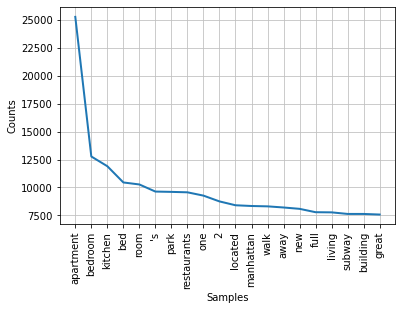

In [421]:
freq = nltk.FreqDist(flat_text)
for key,val in freq.items():
    print(str(key) + ':' + str(val))
freq.plot(20, cumulative=False)
plt.show()

In [422]:
topWords = freq.most_common(10000)

topWords

[('apartment', 25254),
 ('bedroom', 12771),
 ('kitchen', 11901),
 ('bed', 10450),
 ('room', 10270),
 ("'s", 9635),
 ('park', 9607),
 ('restaurants', 9568),
 ('one', 9273),
 ('2', 8755),
 ('located', 8411),
 ('manhattan', 8345),
 ('walk', 8313),
 ('away', 8212),
 ('new', 8091),
 ('full', 7790),
 ('living', 7776),
 ('subway', 7635),
 ('building', 7634),
 ('great', 7581),
 ('neighborhood', 7077),
 ('1', 7001),
 ('space', 6854),
 ('floor', 6738),
 ('brooklyn', 6614),
 ('large', 6383),
 ('train', 6360),
 ('access', 6334),
 ('place', 6289),
 ('blocks', 5950),
 ('street', 5938),
 ('close', 5895),
 ('two', 5838),
 ('bathroom', 5623),
 ('city', 5620),
 ('private', 5388),
 ('home', 5289),
 ('quiet', 5270),
 ('minutes', 5253),
 ('queen', 5220),
 ('bars', 5101),
 ('beautiful', 5023),
 ('block', 5021),
 ('available', 4971),
 ('central', 4894),
 ('tv', 4890),
 ('area', 4883),
 ('square', 4697),
 ('nyc', 4671),
 ('size', 4652),
 ('spacious', 4569),
 ('east', 4521),
 ('also', 4511),
 ('stay', 4257),
 

In [423]:
less_freq = list(filter(lambda x: x[1]<=208 & x[1]>=3,freq.items()))
less_freq

[('luggage', 144),
 ('distant', 16),
 ('gladly', 16),
 ('th', 128),
 ('occupants', 16),
 ('financial', 192),
 ('nail', 16),
 ('boasts', 208),
 ('industrial', 128),
 ('emerging', 16),
 ('saraghina', 64),
 ('latex', 16),
 ('low-key', 16),
 ('early', 128),
 ('pk', 16),
 ('300', 64),
 ('thank', 128),
 ('practice', 16),
 ('interact', 80),
 ('architects', 16),
 ('whenever', 80),
 ('opening', 64),
 ('dark', 64),
 ('daily', 144),
 ('recommend', 128),
 ('highly', 64),
 ('shore', 16),
 ('spice', 16),
 ('artistically', 16),
 ('11', 144),
 ('-great', 16),
 ('usable', 16),
 ('architecture', 144),
 ('infants', 16),
 ('ethnically', 16),
 ('hdtv', 128),
 ('jz', 16),
 ('nations', 80),
 ('cheap', 80),
 ('off-limits', 16),
 ('professionally', 128),
 ('bedside', 16),
 ('fr', 16),
 ('squeeze', 16),
 ('plank', 16),
 ('williamsburg/greenpoint', 16),
 ('bistros', 16),
 ('-fresh', 16),
 ('grounds', 16),
 ('describe', 16),
 ('citi-bike', 16),
 ('30th', 80),
 ('spanning', 16),
 ('sensitive', 144),
 ('‘', 16),
 (

freq provides the full list of words and associated frequencies in the order they were iterated through, as well as a plot of the top occurring words.

We can then apply .most_common to get the 1000 most common words, sorted in descending order

In [424]:
# Turning the list of lists into a flat list for frequency distribution
flat_text = []
for sublist in text_filtered:
    for item in sublist:
        flat_text.append(item)
        
flat_lem = []
for sublist in lem_filtered:
    for item in sublist:
        flat_lem.append(item)

In [425]:
flat_lem

['beautiful',
 'sunlit',
 'brownstone',
 '1-bedroom',
 'loveliest',
 'neighborhood',
 'brooklyn',
 'block',
 'promenade',
 'brooklyn',
 'bridge',
 'park',
 'stunning',
 'view',
 'manhattan',
 'great',
 'shopping',
 'food',
 'enjoy',
 'travelling',
 'stay',
 'manhattan',
 'place',
 'centrally',
 'located',
 'near',
 'time',
 'square',
 'central',
 'park',
 'easy',
 'access',
 'main',
 'subway',
 'well',
 'walking',
 'distance',
 'many',
 'popular',
 'restaurant',
 'bus',
 'tour',
 'place',
 'close',
 'subway',
 'totto',
 'ramen',
 'hell',
 "'s",
 'kitchen',
 'ippudo',
 'westside',
 'empanada',
 'mama',
 'intrepid',
 'sea',
 'air',
 'space',
 'museum',
 'place',
 'ha',
 'three',
 'true',
 'bedroom',
 'one',
 'bathroom',
 'kitchen',
 'stocked',
 'stainless',
 'steel',
 'appliance',
 'like',
 'keurig',
 'machine',
 'living',
 'room',
 'spacious',
 'accommodate',
 'another',
 'person',
 'thanks',
 'pull',
 'bed',
 'place',
 'centrally',
 'located',
 'top',
 'attraction',
 'city',
 'feel',
 

beautiful:5023
sunlit:72
brownstone:1499
1-bedroom:257
loveliest:13
neighborhood:7077
brooklyn:6614
blocks:5950
promenade:126
bridge:800
park:9607
stunning:369
views:2001
manhattan:8345
great:7581
shopping:2374
food:1247
enjoy:2887
travelling:41
stay:4257
place:6289
centrally:614
located:8411
near:1993
times:2187
square:4697
central:4894
easy:2370
access:6334
main:745
subways:1088
well:2947
walking:3486
distance:3070
many:2406
popular:344
restaurants:9568
bus:1518
tours:28
close:5895
subway:7635
totto:6
ramen:34
hell:348
's:9635
kitchen:11901
ippudo:6
westside:49
empanada:3
mama:14
intrepid:32
sea:34
air:2113
space:6854
museum:1729
three:1207
true:735
bedrooms:2655
one:9273
bathroom:5623
stocked:794
stainless:643
steel:588
appliances:1673
like:2247
keurig:96
machine:527
living:7776
room:10270
spacious:4569
accommodate:686
another:366
person:827
thanks:168
pull:447
bed:10450
top:1527
attractions:781
city:5620
feel:1912
free:2142
explore:547
entire:2636
apartment:25254
worry:75
sharing:1

tribeca:258
conveniences:98
respite:54
weary:5
traveler:141
classically:9
in-unit:84
washer/drier:11
concierge/:1
nominal:4
fee:302
party:157
zero:46
cycling:14
picnicking:5
world:756
ferry:408
mcarren:1
2.:130
cat:306
dog:132
dog/cat:1
walker:10
tend:22
knock:14
answers:11
tompkins:167
pk:16
plan:357
bathroom/bathtub:1
bathroom/shower:11
300:64
faces:262
south:736
relaxed:97
gem:242
9th:136
17th:11
fold-out:43
persons:86
night:1114
utilities:188
electricity:47
air-condition:3
heat:437
keyed:51
entry:221
foyer:81
max:104
thank:128
interest:58
inquiring:19
submitting:10
reservation:158
request:416
send:143
expected:20
arrival:395
depart:7
outstanding:45
hesitate:91
attention:59
look:292
forward:98
creating:36
warmly:13
michael:8
suitable:172
range:189
school:147
dealership:1
1/2:225
twice:44
date:41
amenity:57
turn:134
find:1080
solace:8
practice:16
meet:404
information:195
specifically:18
rem:1
greenwood:33
bonuses:3
-dishwasher:12
-heated:1
-private:26
roof:1007
-pull:4
turns:63
-awes

spending:44
fourth:114
l.:42
discover:67
menu:7
clearly:8
arrangements:72
standard:144
reservations:40
workshop:3
plugin:2
wi:70
127:2
11249.:1
input:6
accurate:15
tank:10
limited:80
14:108
24hour:13
reliable:40
myrtle:78
18-29:1
march:25
4/5:88
sending:18
inquiry:23
fullest:15
cup:56
clubbing:1
worn:7
15-20:99
cooper:37
hewitt:9
smithsonian:4
jewish:41
breur:1
gagosian:5
centered:12
hub:140
meesh:1
cats:153
35th:16
restaurants/bars:46
murray:110
variety:205
awaits:40
effort:15
resources:12
creativity:19
invested:10
finding:19
heaven:34
craziness:11
accommod:1
m101:3
crosses:4
choices:40
wherever:35
inexpensive:28
dim:12
claustrophobic:1
fdr:28
climber:1
21st:35
360°:5
wraparound:8
state-of-the-art:41
ferries:19
battery:97
dollars:19
lirr:145
jamaica:51
q6:1
q60:4
q40:1
cars:43
stately:10
homes:81
ground-floor:18
rear:122
porches:7
room-:10
inflatable:99
airbed:81
grape:7
arbor:9
flushing:86
one-way:5
parsons:9
bowne:1
kissena:18
classy:34
congratulations:3
opportunity:64
brag:1
instag

-window:3
2/3/b/q:7
boulders:1
botani:1
900sf:6
queens-:4
tennis:92
courts:78
skate:13
definition:25
d/w:14
ditmars:36
•5:2
opulent:3
convection:20
110mbps:1
babies:23
rfk:3
reflects:25
egypt:2
diners:22
vegetarian:17
soup:4
rushing:1
points:45
//www.airbnb.com/rooms/9614378:2
2bedroom:10
2bathroom:1
47th:10
curling:14
smarttv:19
responsive:37
gue:13
latest:29
washer/:18
paddle:5
boat:32
tempur-pedic:46
parkside:16
met/central:1
meets:66
solid:23
updating:7
room/dining:31
16th:18
detailing:14
bed.near:1
museum/central:1
bathroom/shower/tub:1
staff:49
room/kitchenette:5
world-famous:14
fashioned:9
pedestal:7
buzz:31
lately:4
recognized:11
password:34
pl:23
crows:1
20mins:21
driving:62
mets:17
citifield:14
欢迎来到云驿站:1
家庭式温馨的休息站。整层三大卧室及大客厅全部重新粉刷清洁。小区所在地闹中取静,2个街口至广式酒楼东云阁:1
上海餐馆亚洲餐馆以及中国超市。交通方便:1
仅10分钟巴士可至7号地铁:1
近高速30分钟至曼哈顿。免费停车:1
免费无线及60个中文频道:1
exquisitely:10
curtain:34
leisurely:13
two-fami:1
shops/great:1
least:71
majority:22
w/u:1
renter:13
periods:16
gw:9
bx6:3
nineteenth-century:4
loft-l

doughnuts:4
sage:4
uniondocs:1
park—are:1
lightning-fast:2
8:00:7
gy:2
bedroom/bathroom:7
sky-blue:1
institute:49
art/design:1
nation:11
apartment~:1
leave~:1
thankyou~:1
brooklyn+manhattan:1
satisfy:10
reac:1
fresher:1
solos:4
wing:8
•large:5
modernly:10
•comfortable:5
•t.v:1
•extras:1
•open:1
•your:1
2-floor:6
scintillating:1
cozier:7
word:12
lasko:1
sight/nor:1
theft:1
yea:1
transpo:1
hide-away:2
2-room:2
civil:11
war-era:2
horticulture:1
•bedroom:4
sealy:16
pillowtop:12
shade:18
•sitting:1
ove:5
seventh:12
corbusier:1
console:12
wif:4
drain:2
equipped.the:1
1911:1
late-night:9
aspect:8
crow:2
houston:54
gon:16
na:37
judge:1
discuss:34
seated:10
shiny:8
adorn:9
well-sized:5
streams:8
framing:3
porcelian:1
acoustical:1
bui:8
drench:4
broo:4
family-like:1
coziest:7
bedford-l:1
museo:6
del:16
barrio:23
bulding:2
int:13
amor:2
cubano:1
ricardo:3
san:10
crietobol:1
cabal:1
encluded:1
1st.,2nd:1
viewed:3
vaga:1
naomi:2
rag:3
vega:1
viajero:1
cero:1
el:42
chavita:1
dealing:3
thread-count:3

possessions:5
mana:1
modernity:3
floor/beautiful:1
icing:3
cake:5
priv:5
900sqft:3
fireplcs:1
cond:2
lrg:1
dishwshr:1
blk:8
broadway/timessq:1
subway2-3:1
jay-z:3
notorius:1
born:15
railroad-style:17
kitten:4
conserved:1
5am:1
timeframe:1
appreciated:21
tha:4
yhe:1
separeted:1
waste:11
bin:6
tissue:7
person–please:1
v60:2
farm-fresh:1
oatmeal:4
mindful:26
train—close:1
away—literally:1
b/d/f/m/6/n/r:2
gradually:2
popped:3
developing:7
lacks:5
flock:10
splitting:1
association:1
maturing:1
full-fledged:1
k-town:6
orange:52
7+:3
internationally:18
unwinding:8
trekking:4
creaky:2
bubbling:3
familiarity:2
granny:1
if/when:4
junior1:2
arrived:6
peoples:6
fields/:1
lennon:4
boulud:4
clarins:1
l'occitane:2
reiss:3
cross-town:8
2-bedrooms:4
shaded:12
dec18:1
jan17:1
heigh:5
mocha/espresso:1
jamming:1
oren´s:1
bx36:4
bx40:4
bx41:2
bx3:4
restaurat:2
burger:30
liquer:1
cellular:1
snicker:1
tiene:3
tren:2
todas:1
las:4
b36:1
bx42:2
estan:1
como:2
donald:5
comidas:2
hispanas:1
pizzas:5
más:1
-el:1
a

w/lounges:1
cabanas:1
w/lacquered:1
dishwasher/stove/built-in:1
fridge/ceasarstone:1
w/chaise:1
desk/work:4
basins:1
w/floor:1
ceili:1
spectrum:2
remarkable:11
scheme:3
hallmarks:1
striped:2
coverings:4
legacy:5
louis:13
xvi:3
charmed:5
maisonette:1
~self:1
~1:2
~2:1
satisfying:2
novelty:2
becaus:1
a-c-2-3-4-5-j-z-r:1
fully-equiped:5
ammenities:6
refridgerator:5
lefferts-gardens:1
rush-hour:1
georges:5
sun-flooded:3
tolix:1
state-of-the:6
hansgrohe:2
axor:1
bike-share:4
australians:1
programmable:2
bamboo-foam:1
resolve:2
carol:3
sq.ft.:2
handpicked:2
potential:19
barnard:6
apartmenr:1
night-fyi:1
superbowl:18
in/check:8
phone/text:26
couch/floor:1
battle:5
stori:2
sq.:13
sixties:1
partially:15
futon/chaise:1
resting:16
projector/cinema:1
east-side:3
laundr:2
plan…:1
nig:4
upfront:7
adamant:3
sanitary:4
enlist:1
domestic:9
disinfect:1
swap:4
saving:7
diligently:2
shelter:5
outdated:2
prospect/crown:6
northwest:6
counter/breakfast:1
williamsb:3
turtle:8
donna:3
jake:1
bunch-o-bagels:1
s

forniture:1
second-floor:12
23-minute:1
desmond:2
dainobu:2
10017:2
810:2
10019:2
nino:2
gluten:2
10036:4
ipanema:2
portuguese:4
xi'an:5
post-war:8
sju:1
st/flushing:1
kim-chi:1
belt:10
flushing/bayside:1
35mins:3
disposition:3
sentimental:1
hygiene:3
technical:3
despise:1
empanadas:2
u.n.:2
bi-level:3
manuel:1
6train:1
affected:3
text-message:1
og:3
bedford/driggs:1
drags:1
lacking:2
food/coffee:1
rowhome:1
grandchildren:1
tobacco:3
jetlagged:1
redid:3
100mbps:5
crib/child:1
whomever:3
minuted:2
handing:7
hoods:5
marion:2
brick-:1
buckwheat:1
customizing:2
drains:2
earthy:5
jenn-air:2
nass:1
five-min:4
6/nrq/bdfm:4
yellowstone:1
corona:8
no-time:1
plen:1
pisticci:1
kuro:2
kuma:2
jin:5
pervasive:2
bikers:3
runners:13
526:1
hand-built:2
1,800:7
white-brick:1
stalls:2
urinals:1
//www.airbnb.com/rooms/15307748:1
sorrounded:1
thought-out:2
nesspresso:3
white-marbled:1
soph:1
7-10min:1
2-3min:2
historyc:1
uva:7
j.g:6
melon:8
smith-9th:1
smoothies:1
juices:7
775:1
m34a:1
wifi/cable:10
afro-s

sg:1
accessorzide:1
opens-up:1
necessity:3
ellipticals:2
midtownflatsnyc:1
one-time:5
park/flatiron:2
cleaner/tailor:1
apartmentthis:1
published:4
heidi:2
gerquest:1
over-dyed:1
hand-stenciled:1
textural:1
embroidered:1
fabrics:3
wools:1
velvets:1
city-stay:1
grimaldi:3
flexed:2
boxing:2
semi-temperpedic:1
typewriter:2
enable:4
copious:3
pleasing:1
norwegian:4
bocce:3
juniper:4
neede:2
quirkiness:1
lines/buses/city:1
fails:2
subzerio:1
modified:3
family/business:1
2-5.:1
downloading:3
youtube/netflix:2
entertaining-:1
woodworking:2
hangings:2
2br/2bth:4
tolerated:3
buts:2
dumbwaiter/lift:2
ihop:5
wendys:1
popeye:2
macdonald:1
angie:1
ska:1
09:1
06:00:2
2bedroooms:1
intersect:3
cronut:4
dominic:1
payard:1
planogram:1
flat/apt:1
caf:4
ash:3
city/sunnyside:1
funhouse:1
laugh:2
detachable:1
500+:4
vhs:2
cassettes:1
nintendo64:1
nes:1
bd/2:1
atlantic/barclay:3
subway/ferry:1
manhattan/grand:2
e-mail/text:1
playg:1
recommending:1
b/c/2/3:1
yay:2
117th:2
folder:2
microstudio:1
architect/desig

9:30pm:2
slope´s:1
quiet-yet-hip:1
solarium:5
coffee/barber:1
12-seat:1
wispy:1
prospects:3
сдаётся:1
районе:1
сентября:2
по:2
депозит:1
договор:1
мебель:1
интернет:1
вода:1
газ:1
включены:1
мин:1
прямо:1
через:1
дорогу:1
daybed/couch:1
citi-bikes:3
domed:1
floorpan:1
50minutes:1
5-10minute:1
10-15minute:1
cosy1:1
bounce:2
modell:1
vodka:1
rocka:1
rolla:1
restriction:1
sparkly:1
hurry:2
200sf:2
2,400:2
alaska:1
tomas:1
afro-carribbean:1
working-class:3
tutorial:1
definetly:1
quitissential:1
melts:1
superhosts:2
unbiased:1
snugly:1
roll-out:1
-add:1
cramming:1
bugs:3
player/chromcast:1
purifier/humidifier:1
8am-4:30pm:1
north-eastern:1
sized/double:2
ike:1
bleachers:1
mtv:3
klein:2
++:2
montreal:1
window-sill:1
barrett:2
gehling:1
reputably:1
//www.airbnb.com/locations/new-york/east-village:4
wheels:3
non-doorman:1
preferentially:1
14min:1
1.4m:1
bea:2
shopping/:2
lululemon:1
1.2:3
mid-term:3
星級新洋房:3
kissena公園旁、24小時巴士旁、便利商店、餐廳、洗衣房、醫院。10分鐘到拉瓜地:2
20分鐘到甘迺迪機場。0.5:2
哩到長島火車站,1.2:2
哩到法拉盛地鐵:2
火

pre-civil:1
seagulls:1
buoys:1
gus:1
22-august:1
2-floors:1
transportion:2
delays:1
3th:3
02.01:1
building.the:1
reachef:1
michellin:1
12/11-12/14:1
//www.airbnb.com/rooms/373618:1
building-type:1
drape:2
-track:1
tidiness:1
drawers.high:1
tv.citibike:1
queit:2
11.:1
waiving:1
ret:1
scotland:1
mamoun:1
f/m/l:1
snugged:1
garden/backyard:2
establish:2
rapport:1
breathed:1
funished:1
lgbtqa:1
slot:3
brevil:1
kureig:1
supplying:1
iike:1
nite/everything:1
manhattan/soho:2
pleny:1
sa:2
-postage:1
-pet:1
keyed-elevator:1
1❤️:1
identifies:1
mart:3
bestbuy:2
pykal:1
refridegerator:1
broan:1
l-:1
2-18:1
gregarious:1
ginger:2
25,26:1
visually:5
transcribes:1
sek'nd:1
32nd/33rd:1
sacs:1
100yards:1
birthed:1
我的房源靠近grand:1
因为温馨和厨房:1
您一定会爱上我的房源。:1
我的房源适合独自旅行的冒险家和商务旅行者。:1
旁边就是梅西:1
和queens:1
喔:1
ceramic-topped:1
reas:1
all-marble:2
10minutes:1
2/3/4/5/n/q/r/b/d:1
abt:2
spruced:1
pp:2
brklyn:4
beads:2
radiating:1
foam/orthopedic:1
eldert:2
driscoll:1
100mb:1
accomplished:2
dennet:2
traders:2
vnyl:1
wiki

wabi:1
furniture-:1
timelessness:1
boa:2
lazyboy:1
12/27/2016:2
12/30/2016:2
center-hall:1
shelving/closet:1
kitchen+:1
•lounge:1
equals:1
restaurants/pubs:1
2/3/4/5/b/q/r/a/g/c:1
offer.3:1
mandarin:1
10'x12:1
hotel-grade:1
counts:1
quik:1
duri:2
n-q-r:3
sag:1
cultural/creative:1
hot-spot:2
lorenzo:1
rookery:1
hana:2
industrial-ish:1
office/closet:1
silly:1
dec.:4
jan.3rd:1
smoking/drug/party:1
multi-channel:1
dvd/video:1
masa:1
bouchon:1
re-decorated:2
felines:2
roomba:1
otherwis:1
w-fi:1
airbnbers:1
cat-like:1
engaging:3
shooping:1
bedrrom:1
1~2minutes:1
zenkichi:1
fornino:2
subway-arounf:2
internet-connected:1
street/hunter:1
consumables:2
inception:3
cadence:1
-restaurants:2
mp3:2
conditio:1
quartets:1
sports/premium:1
channels/netflix/dvr:1
mini-guide:1
granite-top:2
bar/stools:1
nightlife/bar:1
jeremy:1
memorabilia:4
clashing:1
robertas:4
stand-in:1
influential:2
saught:1
movies/channels:2
2minutes:1
briarwood:1
applelocated:1
6am-until:1
msg/penn:2
-countless:1
dog/house:1
upset

decidedly:1
scholars:2
senegalese:1
buliding:1
boutiuques:1
view/water:1
bath/hand:1
weelky:1
85.00:1
shelcy:1
dinning-room:2
ornamentals:1
species:2
micro-ecosystem:1
politely:1
sito:1
metri:1
offre:1
sistemazione:1
climatizzata:1
ristorazione:1
indipendente:1
l'alloggio:1
dispone:1
un'area:1
salotto:1
pranzo:1
lavastoviglie:1
asciugamani:1
biancheria:1
trifecta:1
adapted:2
studio/work:2
custom-fabricated:1
adjusting/sorting:1
contraption:1
mirror/dresser:1
awkward:1
jungalow:2
gramercy/flatiron:1
down—the:1
gramercy/flatiron/chelsea:1
forgo:1
manhattan.closed:1
coexist:1
italian-style:1
few-minute:1
train-green:1
line/35:1
totalling:1
raja:1
cat-lover:1
waterferry:1
neighborhoud:1
buchers:1
messes:2
gugenheim:3
dvd/blu-ray/3d:1
fragile:3
45ft:1
giganitc:1
bdrm/1.5:1
hyper:1
pillows/comforters:1
hdmi/high:1
air/:1
8x6:1
les-:1
otb:1
steakh:1
foragers:2
'tufts:1
brooklyn/nyc:1
jiffy:1
halves:1
revolution:1
northwards:1
champions:1
post-wwii:1
ouput:1
-recessed:1
-deep:1
-speakers:1
out

ich:1
jederzeit:1
erreichbar:1
besprechen:1
dann:1
individuell:1
vorab:1
back-building:1
1917:1
supervized:1
630:1
6a:1
11238:1
hector:1
jimenez:1
1865:1
thereabouts:1
couch/tv:1
6/n/r:1
smogasburg:1
5stops:1
pepegiallo:1
met/:1
5/10/17:1
a-c-b-d-1:1
responds:1
1965:1
covetable:1
night-table:1
ubicación:1
zonas:1
exteriores:1
gente:1
ambiente:1
district…:1
bustle/shopping:1
clean-up:1
-aeropress:1
a/b/c/d/1:2
shows/entertainment:1
explanation:1
full-bed:1
5-burner:1
apartmentl:1
odining:1
owasher:1
obaby:1
owalking:1
ambassador:1
double-door:1
bed-stuy/brooklyn:1
boldera:2
comfortab:1
satiate:1
principe:1
bible:1
-is:1
-check-in:1
-check-out:1
wi.fi:1
st-city:1
but-:1
1300sf:1
wineroom:1
fetta:1
isa:1
frosty/blurry:1
stop.lefferts:1
limestones:1
farming:1
1909.:1
2m:1
ghana:1
skiffs:1
berths-:1
banquettes:1
removing:1
interruptions:1
side.plenty:1
everlasting:1
independent/well:1
overtly:1
unclustered:1
rack-:1
oven/coffee:1
sett:1
356:1
3/15-:1
retriever:1
'everyday:1
privatized:1
ree

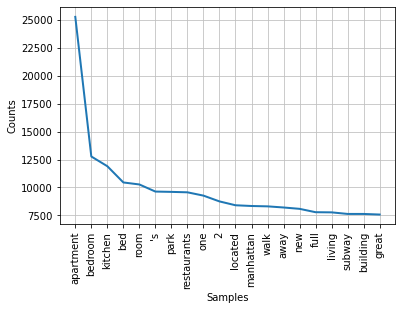

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [426]:
freq = nltk.FreqDist(flat_text)
for key,val in freq.items():
    print(str(key) + ':' + str(val))
freq.plot(20, cumulative=False)

# lem_freq = nltk.FreqDist(flat_lem)
# for key,val in lem_freq.items():
#    print(str(key) + ':' + str(val))
# lem_freq.plot(20, cumulative=False)

I decided I wanted to go further than simple frequency for exploring the contents of the user-created descriptions, so using the returned word lists, paired with a thesaurus and my own knowledge, I decided to group words into a number of different categories based on their similarities. They are as follows:

- "Big" words - Words associated with a property's largeness. Ex: "spacious", "roomy", "wide"
- "Small" words - Similar to above, but for small spaces. Ex: "cozy", "narrow", "minimalist"
- "Public transit" words - Words related to public transportation. Ex: "subway", "station", "buses"
- "Landmark" words - Referring to a specific landmark or well-known attraction in the city. Ex: "MOMA", "empire", "Chinatown"
- "Nightlife" words - Words related to nightlife activities. Ex: "bars", "restaurants", "comedy"
- "Business" words - Any words related to offices or remote-work. Ex: "desk", "laptop", "printer"
- "Safety" words - Words having to do with safety or security. Ex: "alarm", "safe", "secure"
- "View" words - Words relating to the quality of the view out the window. Ex: "overlook", "panorama", "picturesque"
- "Updated" words - Words associated with home improvements or renovations. Ex: "restored", "upgraded", "remodeled"
- "Cleanliness" words - Words around cleanliless and organization. Ex: "pristine", "uncluttered", "immaculate"
- "Tourism" words - Words related to leisure travel and sightseeing. Ex: "getaway", "tours", "attractions"
- "Relaxation" words - Words associated with a relaxing atmosphere. Ex: "oasis", "soothing", "quiet"
- "Family" words - Words denoting the child-friendliness of a property. Ex: "family-friendly", "child-proof", "toys"
- "Proximity" words - Words relating to how nearby a property is to points of interest. Ex: "walkable", "blocks", "minutes"
- "Romance" words - Words associated with love and couples. Ex: "romantic", "anniversary", "couples"
- "Luxury" words - Words implying a property has high-end finishes. Ex: "luxurious", "high-end", "designer"
- "Culture" words - Words relating to arts and culture. Ex: "cultural", "galleries", "community"
- "Ease" words - Words connoting ease and simplicity. Ex: "convenient", "accessible", "automatically"
- "Hip" words - Words associated with youth and popular culture. Ex: "hipster", "stylish", "trendiest"
- "History" words - Refer to the historical nature of a property or its surroundings. Ex: "Pre-war", "classical", "original"
- "Nature" words - Words associated with nature and outdoor spaces. Ex: "parkside", "tree-lined, "greenery"
- "Retail" words - Words and names associated with retail shopping. Ex: "CVS", "supermarket", "boutiques"
- "Negative" words - Words with a negative connotation. Ex: "filthy", "cramped", "chaotic"

I populated each of these lists with words from the descriptions (and variations thereof), and even added synonyms not included so as to start building a knowledge-base independent of this specific dataset.

I then assigned each of these word lists to a new Python list and used set() to turn them into a set.

In [427]:
big_words = ['large', 'larger', 'largest', 'full', 'full-size', 'full-sized', 'fullsize', 'fullsized', 'space', 'spacious', 'big', 'bigger', 'biggest', 'enormous', 'empty', 'open', 'plenty', 'soaring', 'tall', 'high', 'generous', 'gigantic', 'deep', 'deeper', 'deepest', 'wide', 'wider', 'widest', 'kingsize', 'kingsized', 'king-size', 'king-sized', 'expansive', 'huge', 'airy', 'oversize', 'oversized', 'over-size', 'over-sized', 'giant', 'high-ceilings', 'roomy', 'roomier', 'vast', 'vastness', 'sizable', 'sizeable', 'substantial', 'copious', 'massive']
big_words_set = set(big_words)

small_words = ['cozy', 'cosy', 'cozier', 'nestled', 'cosier', 'coziest', 'cosiest', 'coziness', 'cosiness', 'charming', 'cramped', 'minimal', 'minimalist', 'minimalistic', 'tiny', 'tight', 'adorable', 'cheerful', 'claustrophobic', 'narrow', 'functional', 'small', 'smaller', 'smallest', 'cute', 'little', 'modest', 'teeny', 'petite', 'snug']
small_words_set = set(small_words)

pub_trans_words = ['terminal', 'ferry', 'citibikes', 'citibike', 'bus', 'buses', 'busses', 'subway', 'subways', 'train', 'trains', 'transfer', 'walk', 'walking', 'walks', 'steps', 'footsteps', 'metro', 'transport', 'transportation', 'station', 'stations', 'line', 'lines', 'b', 'c', 'd', 'e', 'f', 'g', 'l', 'n', 'q', 'r', 't', 'w', 'mta', 'shuttle', 'connection', 'public', 'transit']
pub_trans_words_set = set(pub_trans_words)

landmark_words = ['zoo', 'cathedral', 'statue', 'guggenheim', 'liberty', 'empire', 'highline', 'chinatown', 'times', 'square', 'flatiron', 'moma', 'bridge', 'destination', 'destinations', 'attraction', 'attractions', 'landmark', 'landmarks', 'sights', 'chrysler', 'met', 'metropolitan', 'museum', 'museums', 'rockefeller', 'radio', 'ellis', 'carnegie']
landmark_words_set = set(landmark_words)

nightlife_words = ['deli', 'delis', 'bar', 'bars', 'restaurant', 'restaurants', 'nightlife', 'night-life', 'pub', 'pubs', 'cafe', 'cafes', 'eatery', 'eateries', 'club', 'clubs', 'venue', 'venues', 'broadway', 'musical', 'show', 'shows', 'theater', 'theaters', 'theatre', 'theatres', 'plays', 'musicals', 'culinary', 'nightclub', 'nightclubs', 'night-club', 'night-clubs', 'comedy', 'improv', 'comedy-club', 'jazz', 'lounge', 'lounges', 'cuisine', 'eat', 'dining', 'dine', 'concert', 'concerts', 'opera', 'ballet', 'gourmet', 'brewery', 'breweries', 'bistro', 'bistros', 'stage', 'cinema', 'carnegie', 'entertainment']
nightlife_words_set = set(nightlife_words)

business_words = ['business', 'work', 'working', 'worker', 'workplace', 'workspace', 'laptop', 'printer', 'print', 'businessmen', 'businessman', 'businessperson', 'live/work', 'office', 'ethernet', 'job', 'jobs', 'professional', 'professionals', 'organization', 'meeting', 'call', 'workstation', 'computer']
business_words_set = set(business_words)

safety_words = ['quiet', 'quieter', 'quietest', 'friendly', 'safe', 'safer', 'safest', 'safety', 'private', 'privacy', 'secure', 'security', 'camera', 'cameras', 'lock', 'locks', 'lockbox', 'calm', 'reliable', 'discreet', 'doorman', 'surveillance', 'alarm', 'alarms', 'protected', 'protection', 'peace', 'peaceful']
safety_words_set = set(safety_words)

view_words = ['view', 'views', 'vista', 'vistas', 'picturesque', 'pretty', 'window', 'windows', 'pretty', 'panoramic', 'panorama', 'overlook', 'overlooks', 'scenery', 'scene', 'scenes', 'overlooking', 'sunset', 'sunsets', 'sunrise', 'sunrises', 'balcony', 'balconies', 'patio', 'patios', 'waterfront', 'background', 'backgrounds', 'breathtaking', 'unobstructed', 'backdrop', 'surroundings', 'setting', 'skyline', 'skylines', 'sky-line', 'sky-lines', 'sky', 'landscape', 'behold', 'outside', 'stunning']
view_words_set = set(view_words)

updates_words = ['update', 'updates', 'updated', 'renovated', 'renovate', 'modern', 'upgrade', 'upgrades', 'upgraded', 'new', 'newly', 'restored', 'refurbished', 'addition', 'recently', 'added', 'remodel', 'remodeled', 'finished', 'redone', 're-done', 'revitalized', 'restoration', 'construction', 'repainted', 're-painted', 'improvement', 'improvements', 'newly-redone', 'newly-renovated', 'recently', 'redecorated', 'revamped', 'repaired', 'modernized', 'renewed', 'reconditioned', 'rebuilt', 'expansion', 'enhancement', 'enhancements', 'improved', 'transformed', 'converted']
updates_words_set = set(updates_words)

cleanliness_words = ['meticulous', 'meticulously', 'clean', 'cleaner', 'cleanest', 'tidy', 'tidier', 'tidiest', 'pristine', 'cleaning', 'uncluttered', 'immaculate', 'immaculately', 'spotless', 'impeccable', 'impeccably', 'well-maintained', 'condition', 'cleanliness', 'neat', 'orderly', 'orderliness', 'organized', 'shipshape', 'gleaming']
cleanliness_words_set = set(cleanliness_words)

tourism_words = ['visit', 'visiting', 'solo', 'getaway', 'getaways', 'get-away', 'get-aways', 'museum', 'museums', 'tourist', 'tourism', 'attraction', 'attractions', 'vacation', 'vacations', 'vacationing', 'airport', 'laguardia', 'guardia', 'jfk', 'explore', 'exploring', 'exploration', 'adventure', 'adventuring', 'adventurer', 'adventurers', 'flight', 'flights', 'recommendation', 'recommendations', 'guide', 'guidebook', 'guidebooks', 'discover', 'discovery', 'discoveries', 'destination', 'destinations', 'travel', 'travels', 'traveler', 'travelers', 'traveling', 'trip', 'trips', 'sights', 'sightseeing', 'landmark', 'landmarks', 'escape', 'magic', 'magical', 'voyage', 'holiday', 'trek', 'journey', 'venture', 'tour', 'tours']
tourism_words_set = set(tourism_words)

relaxation_words = ['comfy', 'comfortable', 'comfort', 'relax', 'relaxes', 'relaxation', 'relaxing', 'soothe', 'soothing', 'quiet', 'quieter', 'quietest', 'comforting', 'tranquil', 'tranquility', 'peace', 'peaceful', 'unwind', 'homey', 'recharge', 're-charge', 'oasis', 'respite', 'serene', 'serenity', 'comfortably', 'calm', 'calming', 'calmness', 'stillness', 'sanctuary', 'escape', 'lounging', 'leisure', 'retreat', 'haven', 'heaven', 'refuge', 'silent', 'silence', 'resting', 'restful', 'welcoming', 'getaway', 'get-away', 'chill', 'laid-back', 'rejuvenate', 'rejuvenated', 'rejuvenates', 'quietness', 'lazy', 'laziness','snug', 'secure', 'contented', 'at-ease', 'safe-haven', 'safe-harbor', 'casual', 'easy-going', 'refresh', 'refreshed', 'renewed', 'restored', 'revitalize', 'revitalized']
relaxation_words_set = set(relaxation_words)

family_words = ['gather', 'gathering', 'reunion', 'reunions', 'family', 'families', 'fam', 'family-friendly', 'family-oriented', 'kid', 'kids', 'baby', 'babies', 'toddler', 'toddlers', 'high-chair', 'high-chairs', 'child', 'children', 'group', 'boy', 'boys', 'girl', 'girls', 'toy', 'toys', 'games', 'crib', 'cribs', 'teen', 'teens', 'son', 'sons', 'daughter', 'daughters', 'infant', 'infants', 'parent', 'parents', 'mother', 'mothers', 'father', 'fathers', 'playground', 'playgrounds', 'kid-friendly', 'backyard', 'pack-and-play', 'parental', 'playpen', 'park', 'parks']
family_words_set = set(family_words)

proximity_words = ['steps', 'footsteps', 'minutes', 'minute', 'near', 'nearer', 'nearest', 'nearby', 'center', 'central', 'epicenter', 'adjacent', 'close', 'closeby', 'close-by', 'within', 'centrally', 'proximity', 'vicinity', 'equidistant', 'walkable', 'blocks', 'heart', 'surrounded', 'neighboring', 'area']
proximity_words_set = set(proximity_words)

romance_words = ['desirable', 'couple', 'couples', 'romance', 'romantic', 'lover', 'lovers', 'sensual', 'anniversary', 'intimate', 'beloved', 'desire', 'adults', 'getaway', 'getaways', 'get-away', 'get-aways', 'love', 'sex', 'sexy', 'honeymoon', 'honeymooners', 'privacy', 'private', 'married', 'husband', 'husbands', 'wife', 'wives', 'boyfriend', 'boyfriends', 'girlfriend', 'girlfriends', 'wedded', 'bliss', 'wedding', 'passion', 'passionate', 'dating', 'relationship', 'seclusion']
romance_words_set = set(romance_words)

luxury_words = ['magic', 'magical', 'coveted', 'luxury', 'luxuries', 'luxurious', 'luxuriously', 'high-end', 'high-quality', 'world-class', 'renowned', 'renown', 'designer', 'marble', 'celebrity', 'celebrities', 'famous', 'famed', 'fame', 'elegant', 'style', 'stylish', 'plush', 'custom', 'stainless', 'penthouse', 'well-appointed', 'granite', 'leather', 'curated', 'elegance', 'exclusive', 'exclusivity', 'lush', 'sleek', 'tasteful', 'tastefully', 'top-of-the-line', 'sought-after', 'state-of-the-art', 'classy', 'rare', 'rarity', 'upscale', 'up-scale', 'premium', 'lavish', 'lavishness', 'opulent', 'opulence', 'extravagant', 'indulgent', 'chic', 'sophisticated', 'refined', 'limited', 'special', 'posh', 'prestigious', 'ritzy', 'glamorous', 'first-class', 'first-rate', 'finest', 'top-quality']
luxury_words_set = set(luxury_words)

culture_words = ['culture', 'cultural', 'cultures', 'multicultural', 'multi-cultural', 'art', 'arts', 'artist', 'artists', 'gallery', 'galleries', 'symphony', 'community', 'communities', 'locals', 'neighborhood', 'neighbourhood', 'neighbor', 'neighbors', 'neighbour', 'neighbours', 'museum', 'museums', 'met', 'moma', 'artistic', 'mural', 'social', 'socially', 'ethnically', 'gatherings', 'communal', 'culturally', 'mixed', 'diverse', 'diversity', 'customs', 'society', 'civic', 'people', 'traditions', 'enlightening']
culture_words_set = set(culture_words)

ease_words = ['flexible', 'flexibility', 'functional', 'elevator', 'elevators', 'automatic', 'automated', 'automatically', 'ease', 'easy', 'easier', 'easiest', 'convenient', 'conveniently', 'convenience', 'conveniences', 'accessible', 'accessibility', 'reachable', 'access', 'simple', 'simplicity', 'walkable', 'nearby', 'near', 'close', 'close-by', 'effortless', 'effortlessly', 'straightforward', 'uncomplicated', 'painless', 'manageable', 'user-friendly', 'avaliable']
ease_words_set = set(ease_words)

hip_words = ['trend', 'trendy', 'happening', 'young', 'youthful', 'desirable', 'hottest', 'hip', 'hippest', 'hipster', 'style', 'stylish', 'exciting', 'excitement', 'hipster', 'fashion', 'fashionable', 'lively', 'dynamic', 'vibrant', 'vibrance', 'ambiance', 'vibe', 'vibes', 'cosmopolitan', 'trendiest', 'contemporary', 'artsy', 'hotspot', 'chic', 'coolest', 'indie', 'popular', 'fresh']
hip_words_set = set(hip_words)

history_words = ['victorian', 'famous', 'character', 'tudor', 'century', 'authentic', 'vintage', 'venerable', 'history', 'historical', 'historic', 'quaint', 'architecture', 'architectural', 'retro', 'classic', 'classical', 'french', 'iconic', 'prestigious', 'prewar', 'pre-war', 'era', 'war-era', 'antique', 'antiquities', 'iconic', 'tradition', 'traditions', 'traditional', 'rare', 'rarity', 'old', 'original', 'mid-century']
history_words_set = set(history_words)

nature_words = ['sun-drenched', 'roof', 'rooftop', 'green', 'courtyard', 'parkside', 'woods', 'forest', 'forested', 'park', 'parks', 'plant', 'plants', 'nature', 'natural', 'tree', 'trees', 'treelined', 'tree-lined', 'garden', 'gardens', 'greenery', 'sunny', 'botanical', 'outdoor', 'yard', 'yards', 'backyards', 'shade', 'trails', 'trail', 'sunshine', 'organic', 'earth', 'landscape', 'landscaped', 'landscaping', 'leafy', 'grass', 'grassy', 'lawn', 'lawns', 'sunlight', 'sunlit', 'verdant', 'wildlife', 'lush', 'blooms', 'blooming', 'flowers', 'flower', 'flowering', 'in-bloom', 'greenspace', 'green-space', 'open-air']
nature_words_set = set(nature_words)

retail_words = ['duane', 'reade', 'walgreen', 'walgreens', 'cvs', 'wholefoods', 'market', 'markets', 'supermarket', 'supermarkets', 'pharmacy', 'pharmacies', 'bank', 'banks', 'bodega', 'bodegas', 'shop', 'shops', 'shopping', 'grocery', 'groceries', 'store', 'stores', 'boutique', 'boutiques', 'bakery', 'bakeries', 'butcher', 'butchers', 'fruit-stand', 'marketplace', 'open-air-market', 'flea-market', 'bazaar', 'window-shopping', 'retail', 'retailer', 'retailers', 'farmer', 'outdoor-market']
retail_words_set = set(retail_words)

negative_words = ['bad', 'steal', 'loud', 'crime', 'junkie', 'freezing', 'gross', 'dull', 'cramped', 'noisy', 'poor', 'tight', 'squeeze', 'hectic', 'cheap', 'cheaper', 'mess', 'filth', 'tarnished', 'clutter', 'dirty', 'expensive', 'crowded', 'chaos', 'chaotic', 'gritty', 'dodgy', 'messy', 'disorganized', 'uncomfortable', 'worse', 'worst']
negative_words_set = set(negative_words)

Now that our word lists are established, it's time to compare them to each lemmatized description to count how many times one of the target words appear in it. To be clear, this process is not returning the number of instances of *each* target word in the description text, but instead returning the total number of matched words, including duplicates. This integer value is then slotted into that row in a new column associated with that word set.

Once this process is complete, we can drop the set columns containing the target word lists, keeping only the associated integer count columns.

In [428]:
df_NYC['big_words_set'] = [big_words]*len(df_NYC)
df_NYC['big_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.big_words_set)]
df_NYC['big_words'] = df_NYC['big_words'].apply(sum)

In [429]:
df_NYC['small_words_set'] = [small_words]*len(df_NYC)
df_NYC['small_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.small_words_set)]
df_NYC['small_words'] = df_NYC['small_words'].apply(sum)

In [430]:
df_NYC['pub_trans_words_set'] = [pub_trans_words]*len(df_NYC)
df_NYC['pub_trans_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.pub_trans_words_set)]
df_NYC['pub_trans_words'] = df_NYC['pub_trans_words'].apply(sum)

In [431]:
df_NYC['landmark_words_set'] = [landmark_words]*len(df_NYC)
df_NYC['landmark_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.landmark_words_set)]
df_NYC['landmark_words'] = df_NYC['landmark_words'].apply(sum)

In [432]:
df_NYC['nightlife_words_set'] = [nightlife_words]*len(df_NYC)
df_NYC['nightlife_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.nightlife_words_set)]
df_NYC['nightlife_words'] = df_NYC['nightlife_words'].apply(sum)

In [433]:
df_NYC['business_words_set'] = [business_words]*len(df_NYC)
df_NYC['business_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.business_words_set)]
df_NYC['business_words'] = df_NYC['business_words'].apply(sum)

In [434]:
df_NYC['safety_words_set'] = [safety_words]*len(df_NYC)
df_NYC['safety_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.safety_words_set)]
df_NYC['safety_words'] = df_NYC['safety_words'].apply(sum)

In [435]:
df_NYC['view_words_set'] = [view_words]*len(df_NYC)
df_NYC['view_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.view_words_set)]
df_NYC['view_words'] = df_NYC['view_words'].apply(sum)

In [436]:
df_NYC['updates_words_set'] = [updates_words]*len(df_NYC)
df_NYC['updates_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.updates_words_set)]
df_NYC['updates_words'] = df_NYC['updates_words'].apply(sum)

In [437]:
df_NYC['cleanliness_words_set'] = [cleanliness_words]*len(df_NYC)
df_NYC['cleanliness_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.cleanliness_words_set)]
df_NYC['cleanliness_words'] = df_NYC['cleanliness_words'].apply(sum)

In [438]:
df_NYC['tourism_words_set'] = [tourism_words]*len(df_NYC)
df_NYC['tourism_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.tourism_words_set)]
df_NYC['tourism_words'] = df_NYC['tourism_words'].apply(sum)

In [439]:
df_NYC['relaxation_words_set'] = [relaxation_words]*len(df_NYC)
df_NYC['relaxation_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.relaxation_words_set)]
df_NYC['relaxation_words'] = df_NYC['relaxation_words'].apply(sum)

In [440]:
df_NYC['family_words_set'] = [family_words]*len(df_NYC)
df_NYC['family_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.family_words_set)]
df_NYC['family_words'] = df_NYC['family_words'].apply(sum)

In [441]:
df_NYC['proximity_words_set'] = [proximity_words]*len(df_NYC)
df_NYC['proximity_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.proximity_words_set)]
df_NYC['proximity_words'] = df_NYC['proximity_words'].apply(sum)

In [442]:
df_NYC['romance_words_set'] = [romance_words]*len(df_NYC)
df_NYC['romance_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.romance_words_set)]
df_NYC['romance_words'] = df_NYC['romance_words'].apply(sum)

In [443]:
df_NYC['luxury_words_set'] = [luxury_words]*len(df_NYC)
df_NYC['luxury_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.luxury_words_set)]
df_NYC['luxury_words'] = df_NYC['luxury_words'].apply(sum)

In [444]:
df_NYC['culture_words_set'] = [culture_words]*len(df_NYC)
df_NYC['culture_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.culture_words_set)]
df_NYC['culture_words'] = df_NYC['culture_words'].apply(sum)

In [445]:
df_NYC['ease_words_set'] = [ease_words]*len(df_NYC)
df_NYC['ease_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.ease_words_set)]
df_NYC['ease_words'] = df_NYC['ease_words'].apply(sum)

In [446]:
df_NYC['hip_words_set'] = [hip_words]*len(df_NYC)
df_NYC['hip_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.hip_words_set)]
df_NYC['hip_words'] = df_NYC['hip_words'].apply(sum)

In [447]:
df_NYC['history_words_set'] = [history_words]*len(df_NYC)
df_NYC['history_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.history_words_set)]
df_NYC['history_words'] = df_NYC['history_words'].apply(sum)

In [448]:
df_NYC['nature_words_set'] = [nature_words]*len(df_NYC)
df_NYC['nature_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.nature_words_set)]
df_NYC['nature_words'] = df_NYC['nature_words'].apply(sum)

In [449]:
df_NYC['retail_words_set'] = [retail_words]*len(df_NYC)
df_NYC['retail_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.retail_words_set)]
df_NYC['retail_words'] = df_NYC['retail_words'].apply(sum)

In [450]:
df_NYC['negative_words_set'] = [negative_words]*len(df_NYC)
df_NYC['negative_words'] = [np.in1d(x,y) for x,y in zip(df_NYC.lemmatized_desc, df_NYC.negative_words_set)]
df_NYC['negative_words'] = df_NYC['negative_words'].apply(sum)

In [451]:
df_NYC = df_NYC[df_NYC.columns.drop(list(df_NYC.filter(regex='_set')))]
df_NYC.head()

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,proximity_words,romance_words,luxury_words,culture_words,ease_words,hip_words,history_words,nature_words,retail_words,negative_words
0,6901257.0,5.010635,Apartment,Entire home/apt,"""Wireless Internet"",""Air conditioning"",Kitchen...",3.0,1.0,Real Bed,strict,1,...,0,0,0,1,0,0,0,2,1,0
1,6304928.0,5.129899,Apartment,Entire home/apt,"""Wireless Internet"",""Air conditioning"",Kitchen...",7.0,1.0,Real Bed,strict,1,...,6,0,1,1,4,1,0,2,1,0
2,7919400.0,4.976734,Apartment,Entire home/apt,"TV,""Cable TV"",""Wireless Internet"",""Air conditi...",5.0,1.0,Real Bed,moderate,1,...,2,2,0,4,0,0,1,2,0,0
3,17589436.0,4.882802,Apartment,Entire home/apt,"TV,""Cable TV"",Internet,""Wireless Internet"",""Ai...",2.0,1.0,Real Bed,strict,1,...,2,2,1,1,2,1,1,0,0,0
4,18224863.0,4.595120,House,Entire home/apt,"TV,""Wireless Internet"",""Air conditioning"",Kitc...",8.0,1.0,Real Bed,strict,1,...,7,2,0,4,1,0,0,2,2,0


In [452]:
# df_NYC['big_%_desc'] = df_NYC['big_words'] / df_NYC['desc_length']
# df_NYC['small_%_desc'] = df_NYC['small_words'] / df_NYC['desc_length']
# df_NYC['pub_trans_%_desc'] = df_NYC['pub_trans_words'] / df_NYC['desc_length']
# df_NYC['landmark_%_desc'] = df_NYC['landmark_words'] / df_NYC['desc_length']
# df_NYC['nightlife_%_desc'] = df_NYC['nightlife_words'] / df_NYC['desc_length']
# df_NYC['business_%_desc'] = df_NYC['business_words'] / df_NYC['desc_length']
# df_NYC['safety_%_desc'] = df_NYC['safety_words'] / df_NYC['desc_length']
# df_NYC['view_%_desc'] = df_NYC['view_words'] / df_NYC['desc_length']
# df_NYC['updates_%_desc'] = df_NYC['updates_words'] / df_NYC['desc_length']
# df_NYC['cleanliness_%_desc'] = df_NYC['cleanliness_words'] / df_NYC['desc_length']
# df_NYC['tourism_%_desc'] = df_NYC['tourism_words'] / df_NYC['desc_length']
# df_NYC['relaxation_%_desc'] = df_NYC['relaxation_words'] / df_NYC['desc_length']
# df_NYC['family_%_desc'] = df_NYC['family_words'] / df_NYC['desc_length']
# df_NYC['proximity_%_desc'] = df_NYC['proximity_words'] / df_NYC['desc_length']
# df_NYC['romance_%_desc'] = df_NYC['romance_words'] / df_NYC['desc_length']
# df_NYC['luxury_%_desc'] = df_NYC['luxury_words'] / df_NYC['desc_length']
# df_NYC['culture_%_desc'] = df_NYC['culture_words'] / df_NYC['desc_length']
# df_NYC['ease_%_desc'] = df_NYC['ease_words'] / df_NYC['desc_length']
# df_NYC['hip_%_desc'] = df_NYC['hip_words'] / df_NYC['desc_length']
# df_NYC['history_%_desc'] = df_NYC['history_words'] / df_NYC['desc_length']
# df_NYC['nature_%_desc'] = df_NYC['nature_words'] / df_NYC['desc_length']
# df_NYC['retail_%_desc'] = df_NYC['retail_words'] / df_NYC['desc_length']
# df_NYC['negative_%_desc'] = df_NYC['negative_words'] / df_NYC['desc_length']

# df_NYC.head()

With this last NLP mapping process complete, we can pause briefly to drop columns that are no longer needed or won't factor into our analysis going forward.

- 'lemmatized_desc', 'tokenized_desc', and 'tokenized_name' were string-based mid-point columns used to create other analysis columns.
- 'name', 'description', and 'amenities' are string-based as well, and are now redundant to other analysis columns that have been created.
- 'city' and 'room_type' are both single-value columns since we filtered our data to remove non-NYC and single-room properties.

In [453]:
# df_NYC = df_NYC[df_NYC.columns.drop(list(df_NYC.filter(regex='_words')))]
df_NYC.drop(['lemmatized_desc'], axis=1, inplace = True)
df_NYC.drop(['tokenized_desc'], axis=1, inplace = True)
df_NYC.drop(['tokenized_name'], axis=1, inplace = True)
df_NYC.drop(['name'], axis=1, inplace = True)
df_NYC.drop(['description'], axis=1, inplace = True)
df_NYC.drop(['city'], axis=1, inplace = True)
df_NYC.drop(['amenities'], axis=1, inplace = True)
df_NYC.drop(['room_type'], axis=1, inplace = True)
# df_NYC.drop(['id'], axis=1, inplace = True)
df_NYC.head()

,id,log_price,property_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,host_has_profile_pic,host_identity_verified,...,proximity_words,romance_words,luxury_words,culture_words,ease_words,hip_words,history_words,nature_words,retail_words,negative_words
0,6901257.0,5.010635,Apartment,3.0,1.0,Real Bed,strict,1,1,1,...,0,0,0,1,0,0,0,2,1,0
1,6304928.0,5.129899,Apartment,7.0,1.0,Real Bed,strict,1,1,0,...,6,0,1,1,4,1,0,2,1,0
2,7919400.0,4.976734,Apartment,5.0,1.0,Real Bed,moderate,1,1,1,...,2,2,0,4,0,0,1,2,0,0
3,17589436.0,4.882802,Apartment,2.0,1.0,Real Bed,strict,1,1,1,...,2,2,1,1,2,1,1,0,0,0
4,18224863.0,4.595120,House,8.0,1.0,Real Bed,strict,1,1,0,...,7,2,0,4,1,0,0,2,2,0


In [454]:
df_NYC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16242 entries, 0 to 16241
Data columns (total 88 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       16242 non-null  float64
 1   log_price                16242 non-null  float64
 2   property_type            16242 non-null  object 
 3   accommodates             16242 non-null  float64
 4   bathrooms                16242 non-null  float64
 5   bed_type                 16242 non-null  object 
 6   cancellation_policy      16242 non-null  object 
 7   cleaning_fee             16242 non-null  int64  
 8   host_has_profile_pic     16242 non-null  int64  
 9   host_identity_verified   16242 non-null  int64  
 10  host_response_rate       16242 non-null  float64
 11  instant_bookable         16242 non-null  int64  
 12  latitude                 16242 non-null  float64
 13  longitude                16242 non-null  float64
 14  neighbourhood         

One last piece of categorical geographic information that could be useful but does not yet exist in the dataset is which borough a given property belongs to. Using the groupings found [here](https://www.nycbynatives.com/nyc_info/new_york_city_zip_codes.php), I created a list of zip codes for each borough and used them as simple lookups to populate a new 'borough' column. As seen from the .value_counts() output, every listing slotted neatly into one of the five boroughs, and no nulls were created.

In [455]:
manhattan_zips = ["10001", "10002", "10003", "10004", "10005", "10006", "10007", "10009", "10010", "10011", "10012", "10013", "10014", "10015", "10016", "10017", "10018", "10019", "10020", "10021", "10022", "10023", "10024", "10025", "10026", "10027", "10028", "10029", "10030", "10031", "10032", "10033", "10034", "10035", "10036", "10037", "10038", "10039", "10040", "10041", "10044", "10045", "10048", "10055", "10060", "10065", "10075", "10069", "10090", "10095", "10098", "10099", "10103", "10104", "10105", "10106", "10107", "10110", "10111", "10112", "10115", "10118", "10119", "10120", "10121", "10122", "10123", "10128", "10151", "10152", "10153", "10154", "10155", "10158", "10161", "10162", "10165", "10166", "10167", "10168", "10169", "10170", "10171", "10172", "10173", "10174", "10175", "10176", "10177", "10178", "10199", "10270", "10271", "10278", "10279", "10280", "10281", "10282"]
staten_zips = ["10301", "10302", "10303", "10304", "10305", "10306", "10307", "10308", "10309", "10310", "10311", "10312", "10314"]
bronx_zips = ["10451", "10452", "10453", "10454", "10455", "10456", "10457", "10458", "10459", "10460", "10461", "10462", "10463", "10464", "10465", "10466", "10467", "10468", "10469", "10470", "10471", "10472", "10473", "10474", "10475"]
queens_zips = ["11580", "11509", "11004", "11101", "11102", "11103", "11104", "11105", "11106", "11109", "11351", "11354", "11355", "11356", "11357", "11358", "11359", "11360", "11361", "11362", "11363", "11364", "11365", "11366", "11367", "11368", "11369", "11370", "11371", "11372", "11373", "11374", "11375", "11377", "11378", "11379", "11385", "11411", "11412", "11413", "11414", "11415", "11416", "11417", "11418", "11419", "11420", "11421", "11422", "11423", "11426", "11427", "11428", "11429", "11430", "11432", "11433", "11434", "11435", "11436", "11691", "11692", "11693", "11694", "11697"]
brooklyn_zips = ["11201", "11203", "11204", "11205", "11206", "11207", "11208", "11209", "11210", "11211", "11212", "11213", "11214", "11215", "11216", "11217", "11218", "11219", "11220", "11221", "11222", "11223", "11224", "11225", "11226", "11228", "11229", "11230", "11231", "11232", "11233", "11234", "11235", "11236", "11237", "11238", "11239", "11241", "11242", "11243", "11249", "11252", "11256"]

In [456]:
df_NYC['borough']='Unknown'
df_NYC.loc[df_NYC.zipcode.isin(manhattan_zips),'borough']='Manhattan'
df_NYC.loc[df_NYC.zipcode.isin(staten_zips),'borough']='Staten Island'
df_NYC.loc[df_NYC.zipcode.isin(bronx_zips),'borough']='Bronx'
df_NYC.loc[df_NYC.zipcode.isin(queens_zips),'borough']='Queens'
df_NYC.loc[df_NYC.zipcode.isin(brooklyn_zips),'borough']='Brooklyn'

df_NYC['borough'].value_counts()

Manhattan        8706
Brooklyn         6087
Queens           1189
Bronx             159
Staten Island     101
Name: borough, dtype: int64

In [457]:
# df_NYC.describe().to_csv('D:/Springboard/ThirdCapstone/RawData/df_describe.csv', index=False)
df_NYC.describe()

,id,log_price,accommodates,bathrooms,cleaning_fee,host_has_profile_pic,host_identity_verified,host_response_rate,instant_bookable,latitude,...,proximity_words,romance_words,luxury_words,culture_words,ease_words,hip_words,history_words,nature_words,retail_words,negative_words
count,1.624200e+04,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,...,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000
mean,1.128275e+07,5.144753,3.721648,1.146657,0.790543,0.991934,0.657124,93.760170,0.219431,40.730029,...,2.392747,0.797008,0.541005,1.160079,1.489533,0.450129,0.510713,1.495998,0.787341,0.040143
std,6.099302e+06,0.531155,2.077860,0.432584,0.406934,0.089448,0.474685,13.973582,0.413874,0.049289,...,1.972498,1.091124,1.005471,1.372897,1.456229,0.804906,0.944838,1.637980,1.213837,0.216582
min,2.404000e+03,1.609438,1.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,40.508684,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.185909e+06,4.787492,2.000000,1.000000,1.000000,1.000000,0.000000,93.760555,0.000000,40.693056,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.234321e+07,5.075174,3.000000,1.000000,1.000000,1.000000,1.000000,100.000000,0.000000,40.727627,...,2.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,1.640688e+07,5.416100,4.000000,1.000000,1.000000,1.000000,1.000000,100.000000,0.000000,40.762615,...,3.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,2.000000,1.000000,0.000000
max,2.118802e+07,7.600402,16.000000,8.000000,1.000000,1.000000,1.000000,100.000000,1.000000,40.903895,...,17.000000,9.000000,10.000000,14.000000,11.000000,8.000000,9.000000,12.000000,13.000000,4.000000


Now that we have the data that we want in the preferred format, we can begin to explore the shape of our data and the relationship between our variables.

Using .describe() provides us with descriptive statistics for each of our columns. A few items of interest:
- Price is actually the natural log of the true listing price, so we have a nightly "rate" ranging from 1.61 to 7.60 with a mean of 5.14
- The average property has 1.15 bathrooms, 1.29 bedrooms, and accommodates 3.72 people.
- Cleaning fee is a binary variable, so 79.1% of properties require a cleaning fee.
- 22.3% of properties allow for round-the-clock check-in.
- The average property has just under 19 reviews, and a rating of 93.8 out of 100.
- The average # of reviews per month for all properties is almost 1.6, but the median # is barely 0.5, meaning the data is skewed toward zero.
- WiFi and Air Conditioning are our most common amenities, each with over 90% saturation. 
- Cribs, Smart Locks, BBQ Grills, and Pools are all present in fewer than 2% of properties.
- Descriptions average 153 words in length, but the range extends from 446 down to a single word! ('cosy', for the curious) 
- The average host selected just over 17 amenities from Airbnb's pre-populated list. One very thorough host selected 77.
- From our word categories, "proximity" and "public transit" words were understandably most common, with an average of 2.4 and 3.4 such words per property description respectively. Negative words were (thankfully) the least common, occurring only 4 times out of a given 100 properties, on average.
- Consistent with the idea of exclusivity, "luxury" and "hip" words were not especially common, with an average of 0.54 and 0.45 per description respectively.
- Perhaps counterintuitively (at least for the big city), "nature" words were reasonably prevalent. They appeared an average of 1.5 times per description, behind only "proximity", "public transit", "nightlife", and "big" words. 


## Data Visualizations
For the bulk of the data visualization process, I turned the heavy lifting over to Tableau.

The first section contains a selection of histograms outlining the shape of the distributions of several of our measures.

In [458]:
%%HTML
<div class='tableauPlaceholder' id='viz1644772602474' style='position: relative'><noscript><a href='#'><img alt=' ' src='TK&#47;TKJDX78FW&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='shared&#47;TKJDX78FW' /> <param name='toolbar' value='yes' /><param name='static_image' value='TK&#47;TKJDX78FW&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1644772602474');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

In [459]:
%%HTML
<div class='tableauPlaceholder' id='viz1644772799299' style='position: relative'><noscript><a href='#'><img alt=' ' src='YF&#47;YFBRXCRFP&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='shared&#47;YFBRXCRFP' /> <param name='toolbar' value='yes' /><param name='static_image' value='YF&#47;YFBRXCRFP&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1644772799299');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

In [460]:
%%HTML
<div class='tableauPlaceholder' id='viz1644772721724' style='position: relative'><noscript><a href='#'><img alt=' ' src='X2&#47;X2XR5KC8F&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='shared&#47;X2XR5KC8F' /> <param name='toolbar' value='yes' /><param name='static_image' value='X2&#47;X2XR5KC8F&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1644772721724');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

The vast majority of our properties accommodate between 2 and 4, but with a long-sloping right tail that reaches all the way to 16.

In [461]:
%%HTML
<div class='tableauPlaceholder' id='viz1644772967234' style='position: relative'><noscript><a href='#'><img alt=' ' src='N6&#47;N6BF5NDX8&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='shared&#47;N6BF5NDX8' /> <param name='toolbar' value='yes' /><param name='static_image' value='N6&#47;N6BF5NDX8&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1644772967234');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

The distribution of description length has a very tall but very narrow peak between 180 and 210 words, potentially due to a built-in character limit for the user entry. It also has a long leftward tail toward zero, and a very small handful of instances of 240+ words that aren't even visible at this scale. These outliers could be due to unique description formatting that our tokenization process didn't handle well, or some other issue. 

In [462]:
%%HTML
<div class='tableauPlaceholder' id='viz1645398542461' style='position: relative'><noscript><a href='#'><img alt=' ' src='YP&#47;YPXH453CF&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='shared&#47;YPXH453CF' /> <param name='toolbar' value='yes' /><param name='static_image' value='YP&#47;YPXH453CF&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1645398542461');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

Most properties are between 0 and 2 bedrooms (remember that lofts are included), with a long right-sloping tail.

In [463]:
%%HTML
<div class='tableauPlaceholder' id='viz1645398684074' style='position: relative'><noscript><a href='#'><img alt=' ' src='DK&#47;DK77HGTMX&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='shared&#47;DK77HGTMX' /> <param name='toolbar' value='yes' /><param name='static_image' value='DK&#47;DK77HGTMX&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1645398684074');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

The distribution of # of reviews is highly skewed, with most properties between 0 and 60, but with a long sloping tail to the right capping out at 380.

The next two cells show a collection of 8 box and whisker plots for some of our binary amenity variables. This shows us the distribution for both the 'yes' and 'no' options for these amenities as they relate to price.

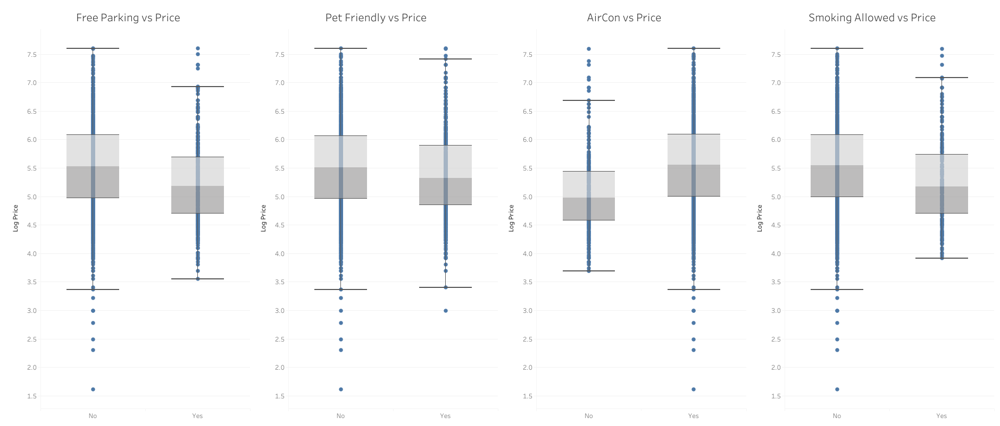

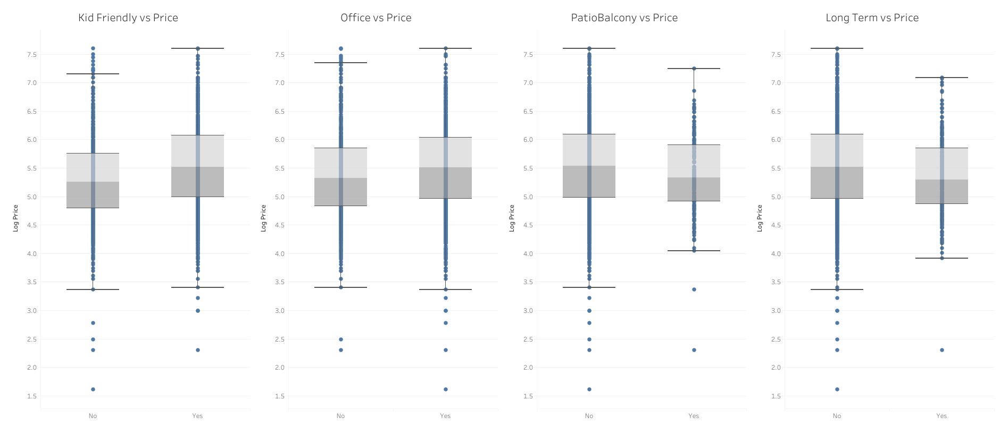

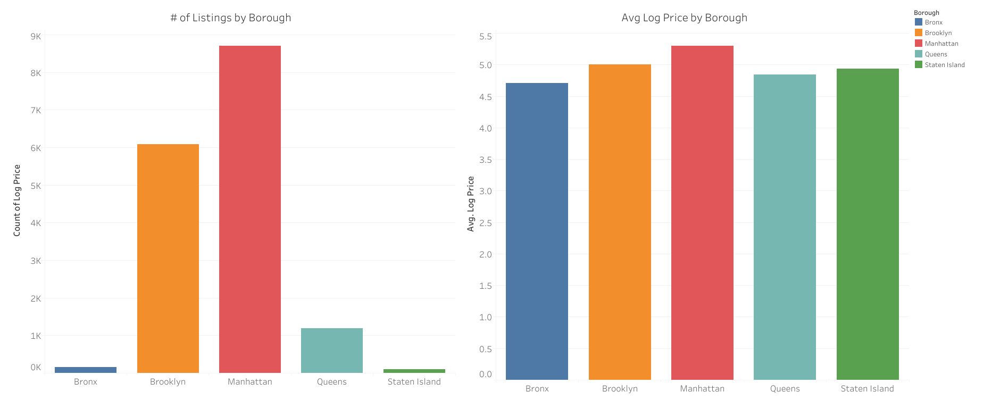

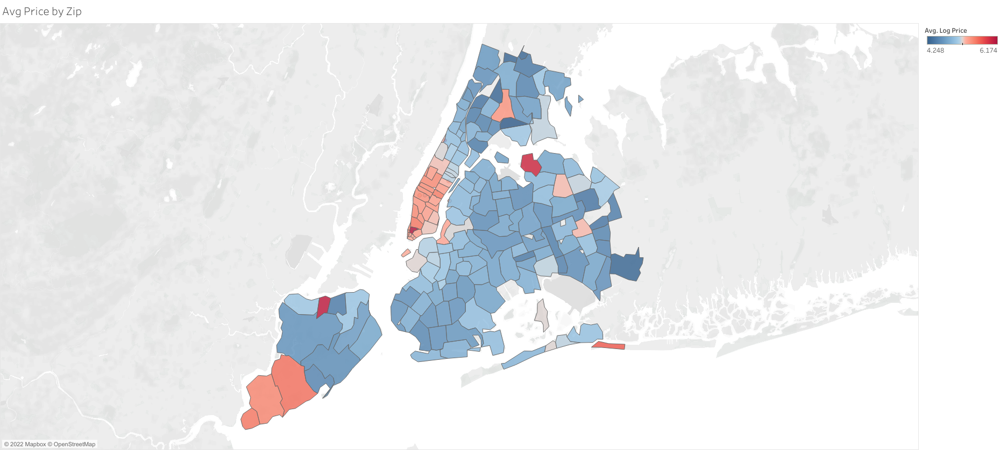

The map above shows the average of log price by zip code. Note the high relative prices in Manhattan and parts of Brooklyn.

The next section contains two different map views for most of our word categories. The first in each grouping shows the % of properties in each zip code whose description includes at least 1 word from that category. The second map view ignores zip code, but shows the approximate location of the 50 properties whose descriptions contain the highest number of instances of category words.

### "Business" Words

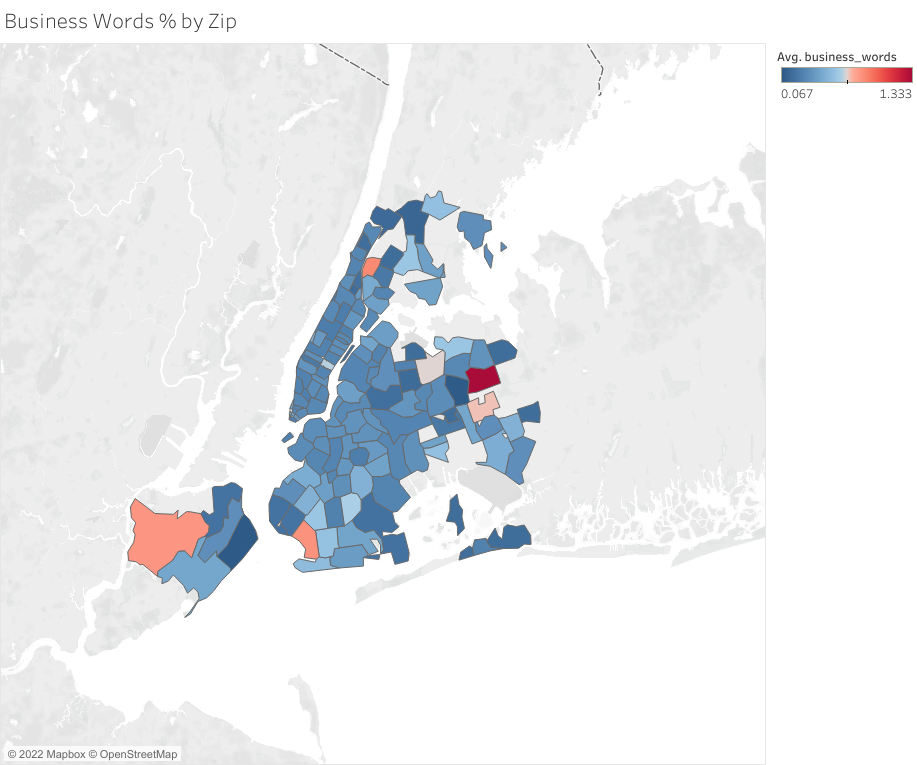

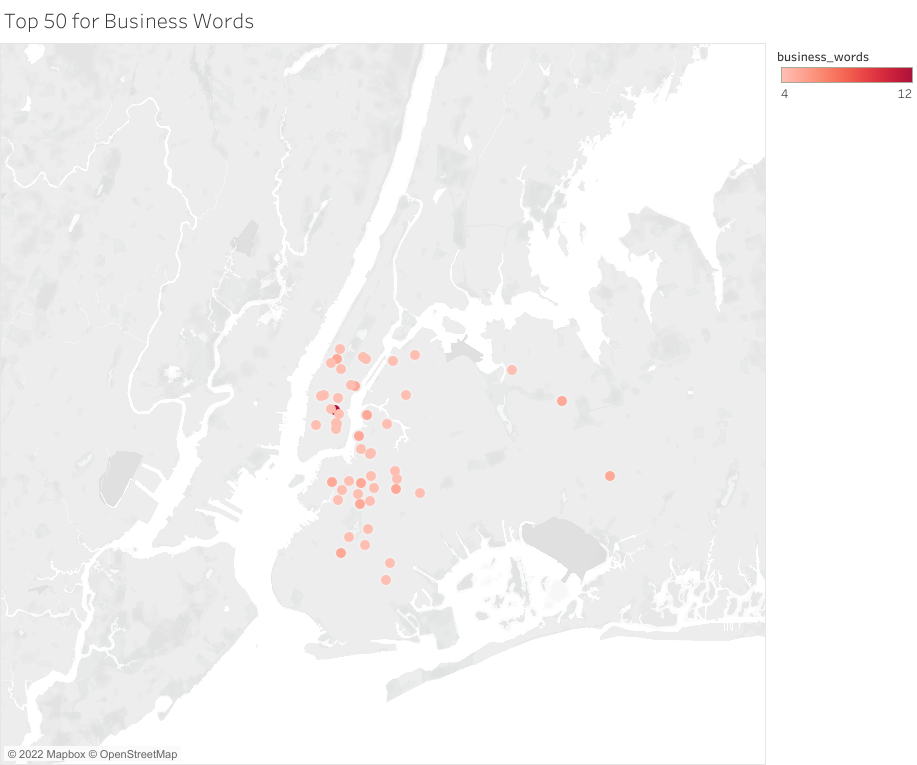

### "Ease" Words

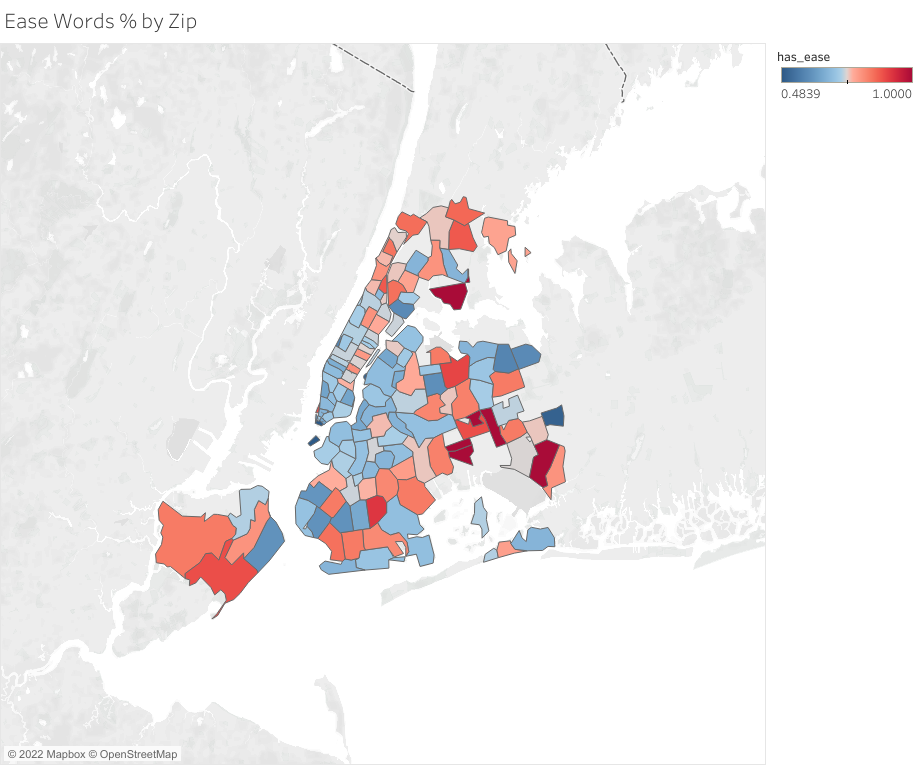

### "Family" Words

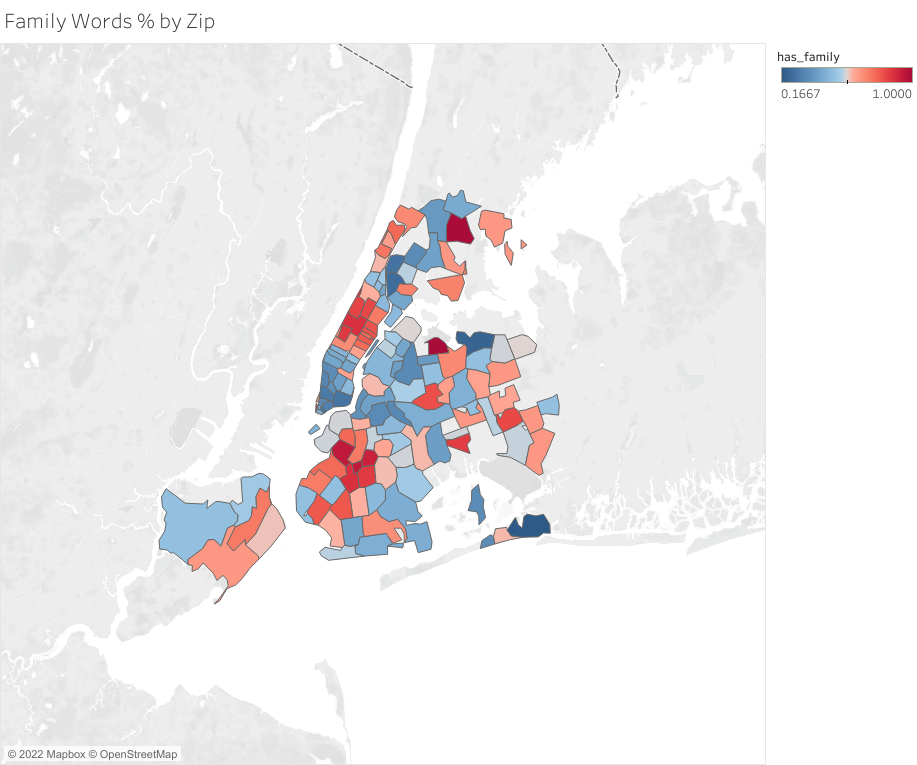

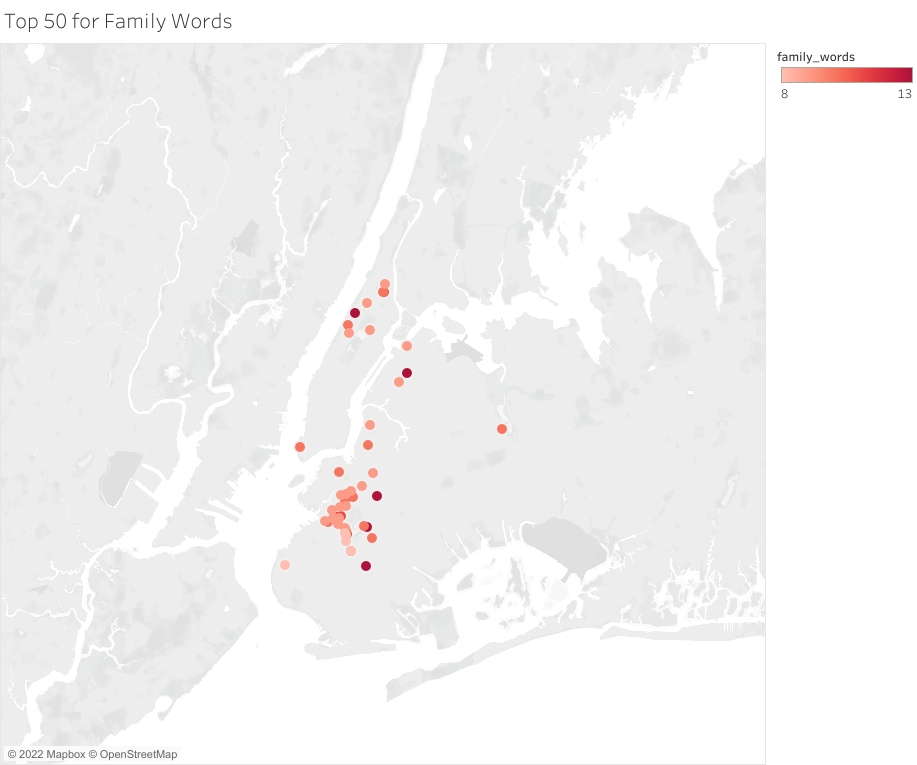

### "Hip" Words

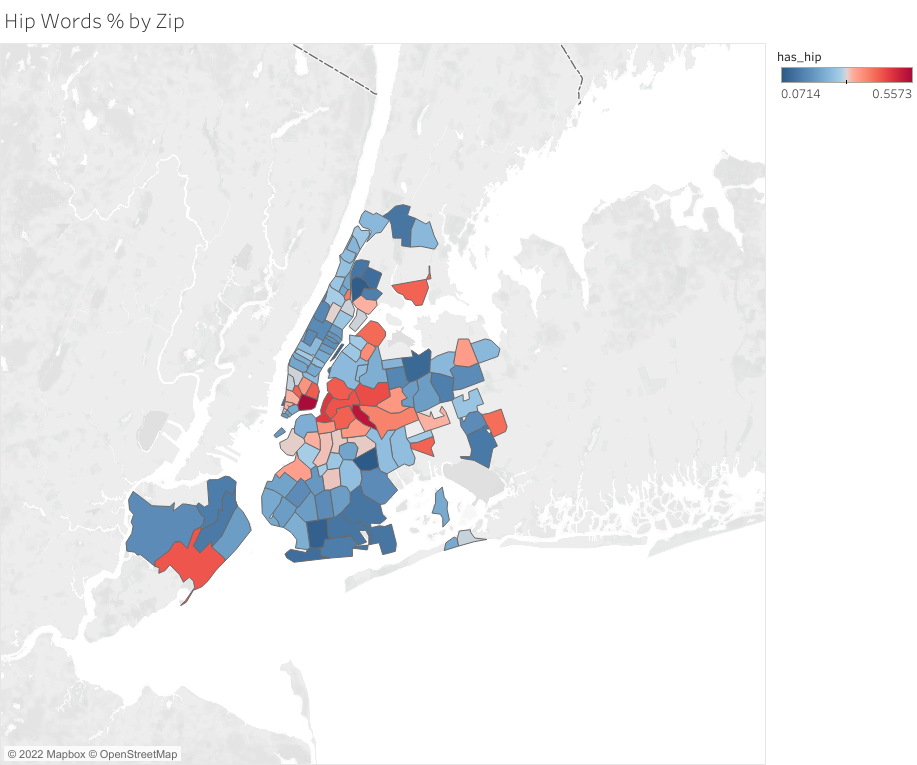

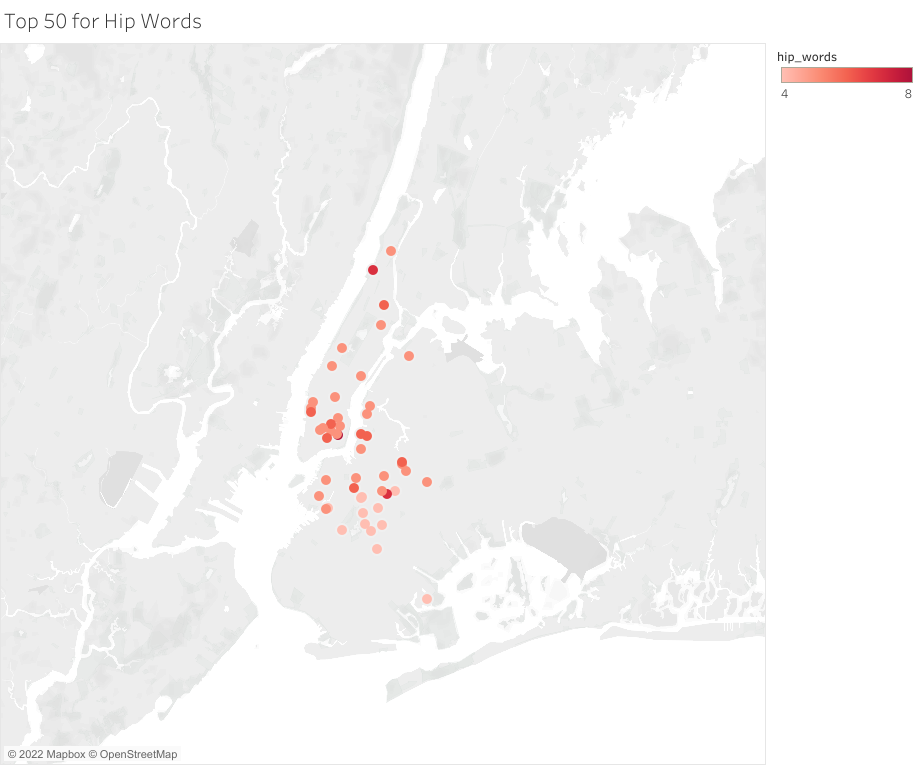

### "History" Words

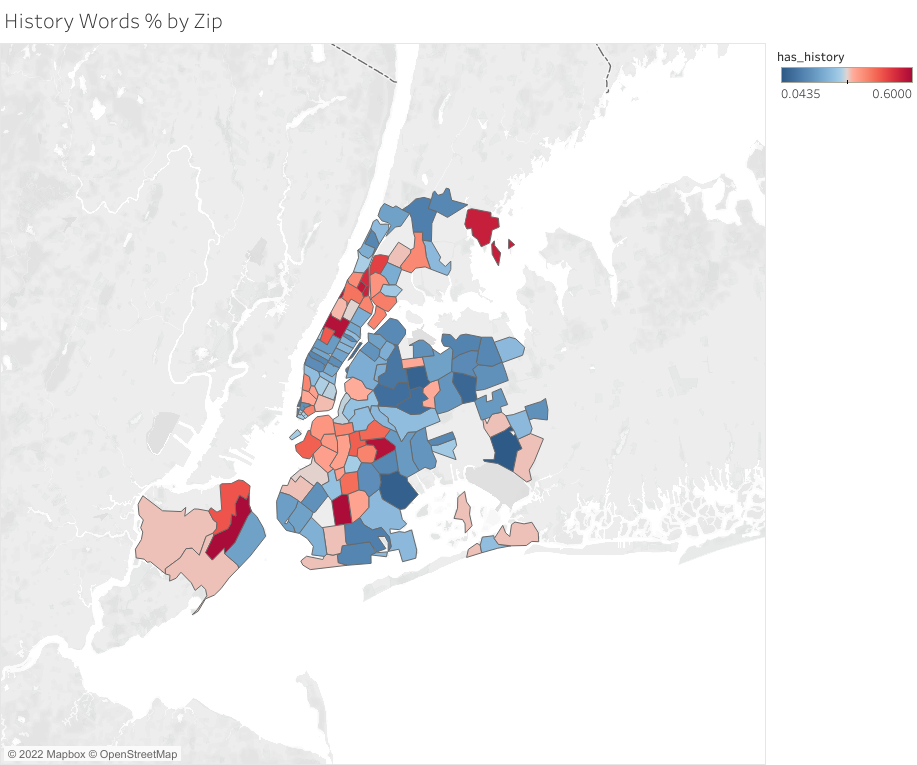

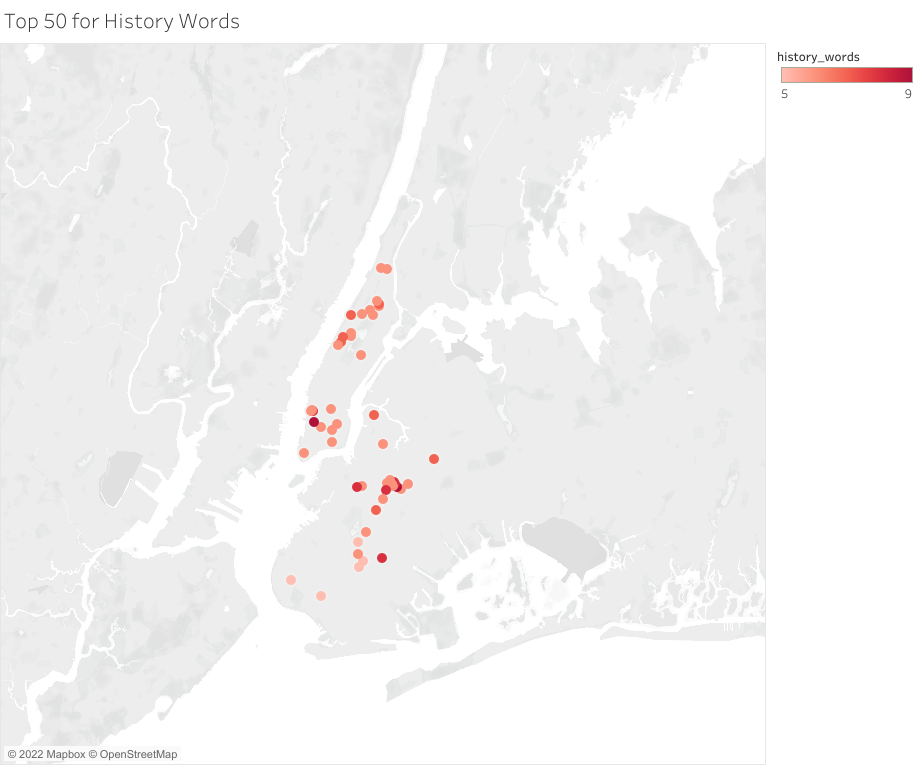

### "Landmark" Words

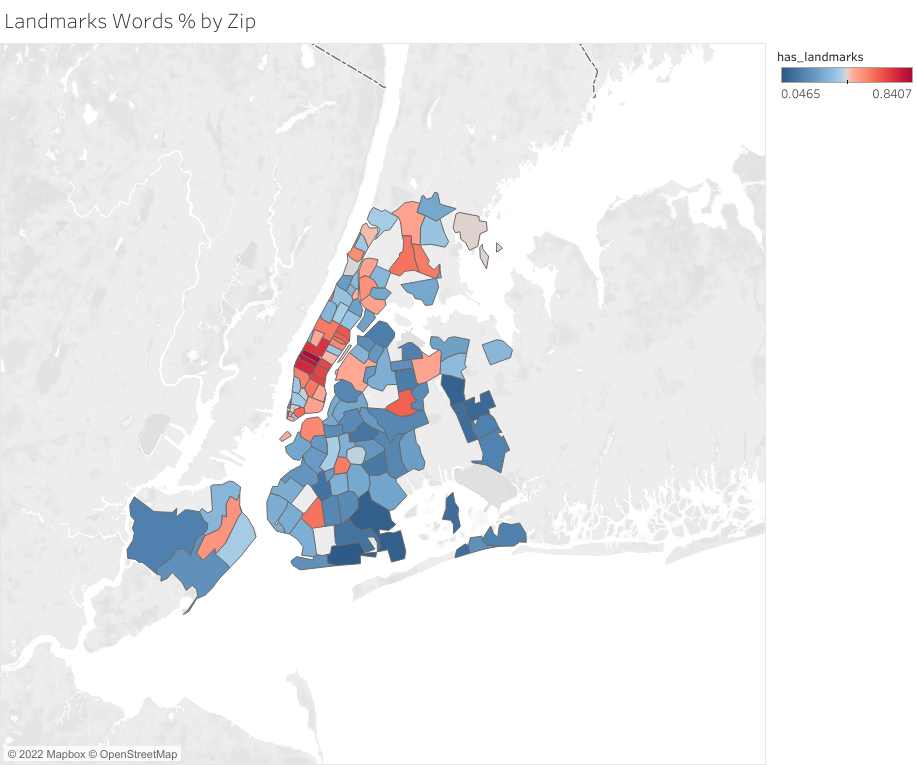

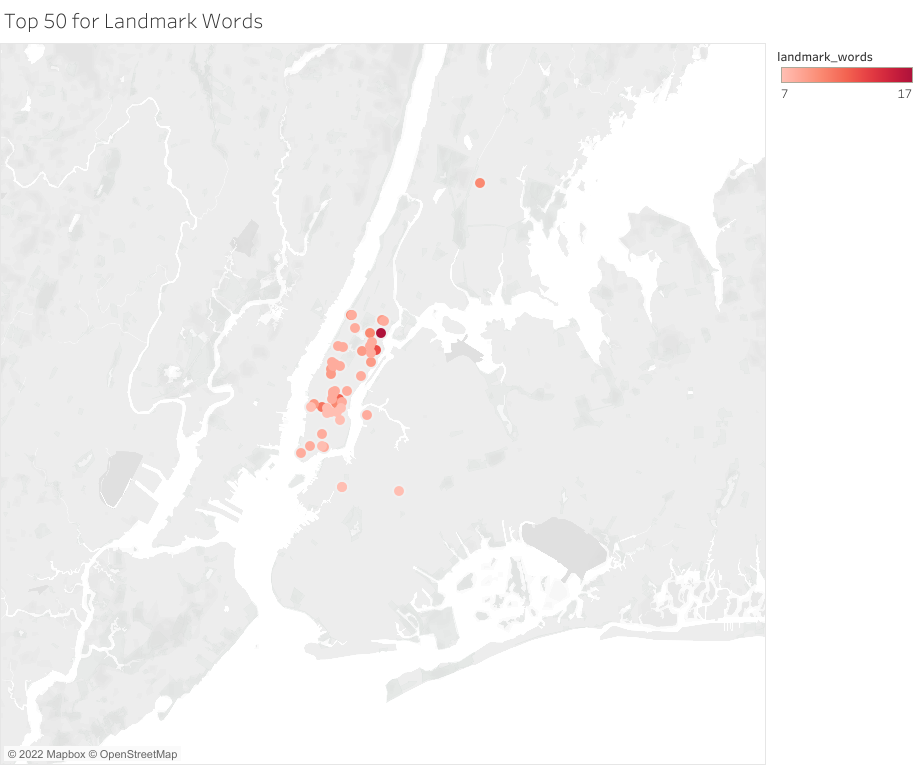

### "Luxury" Words

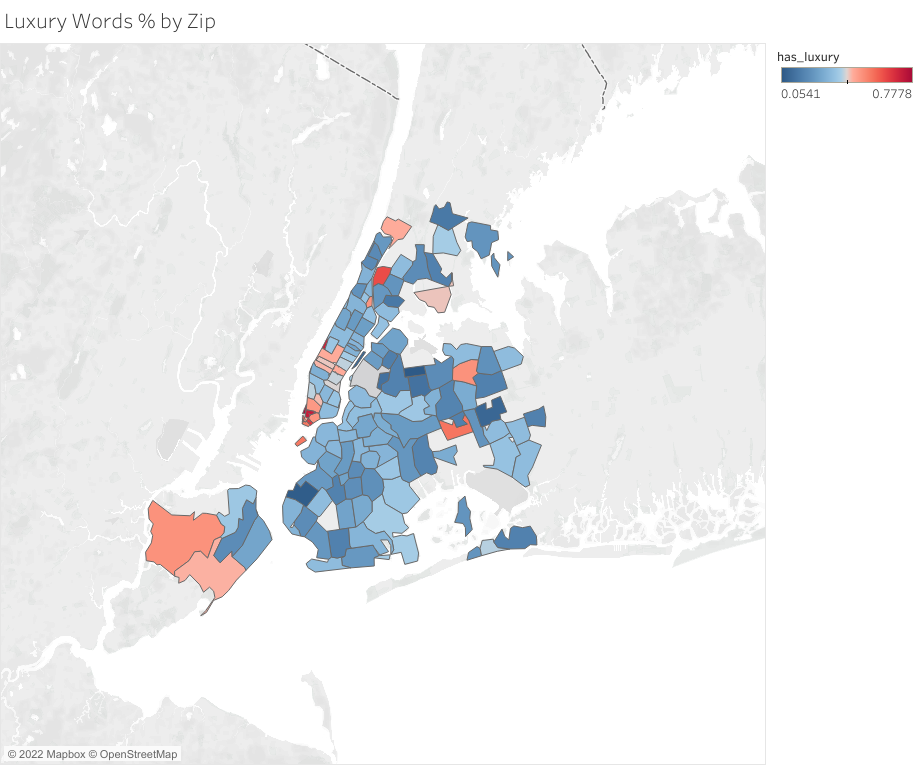

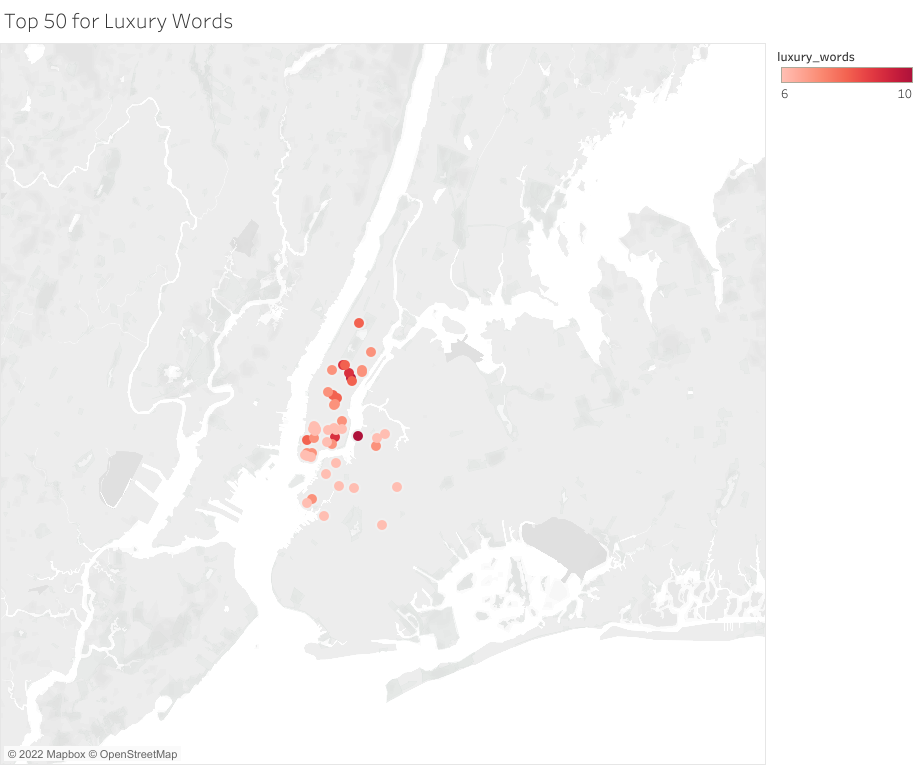

### "Nature" Words

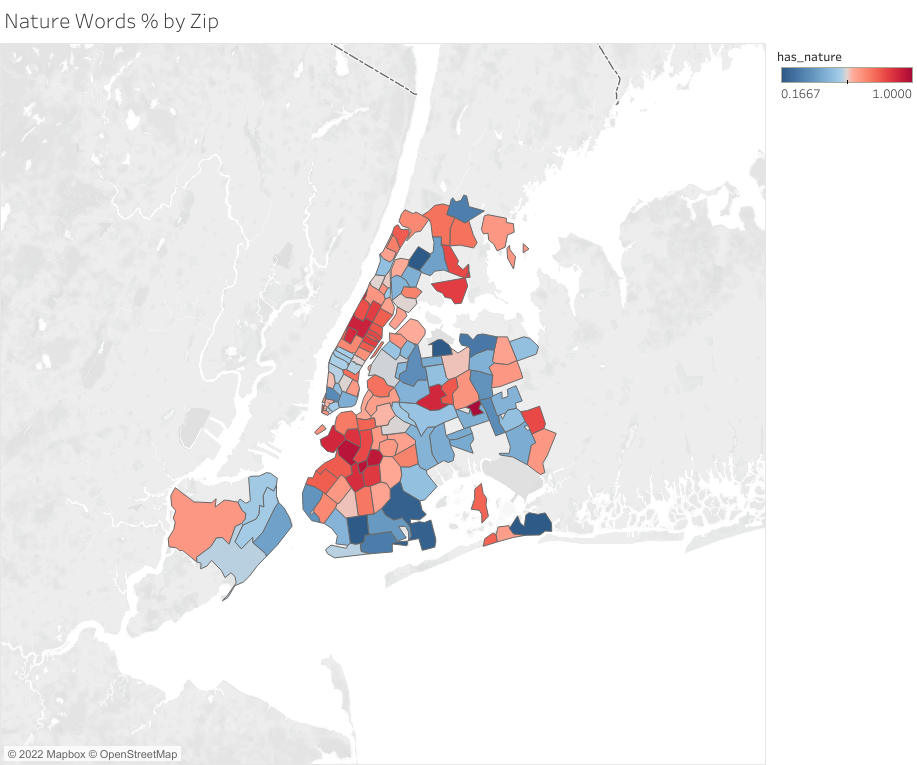

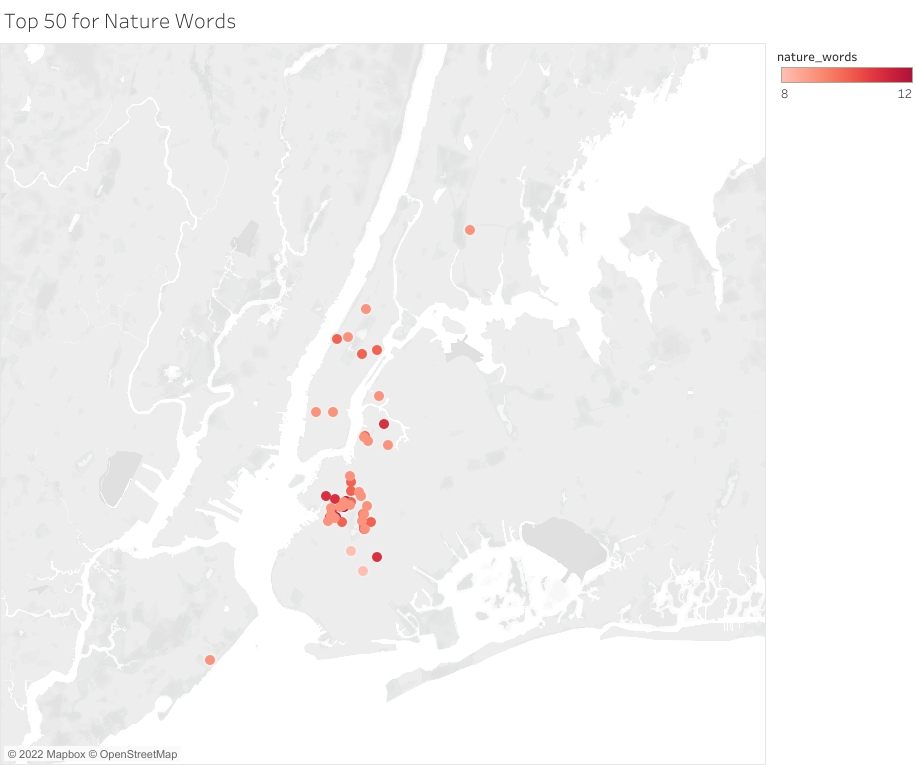

### "Negative" Words

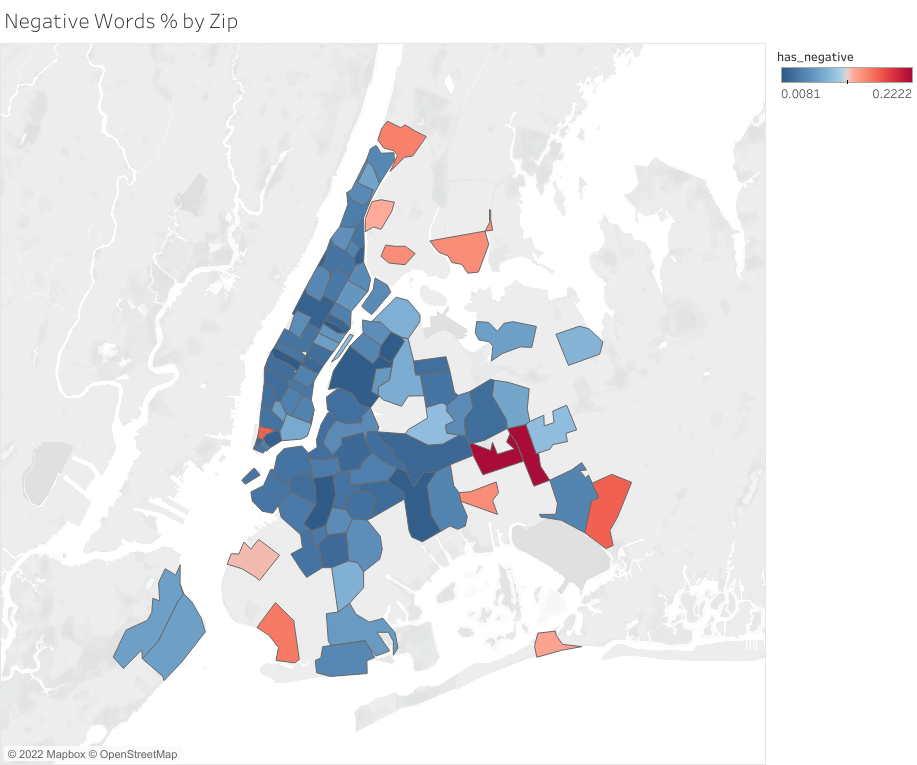

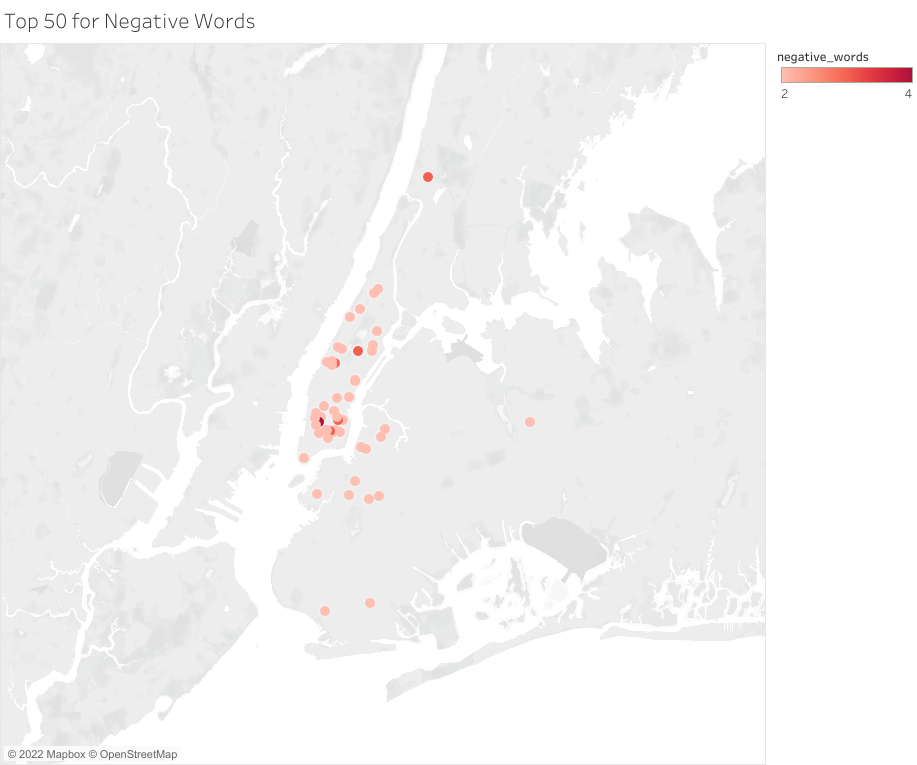

### "Nightlife" Words

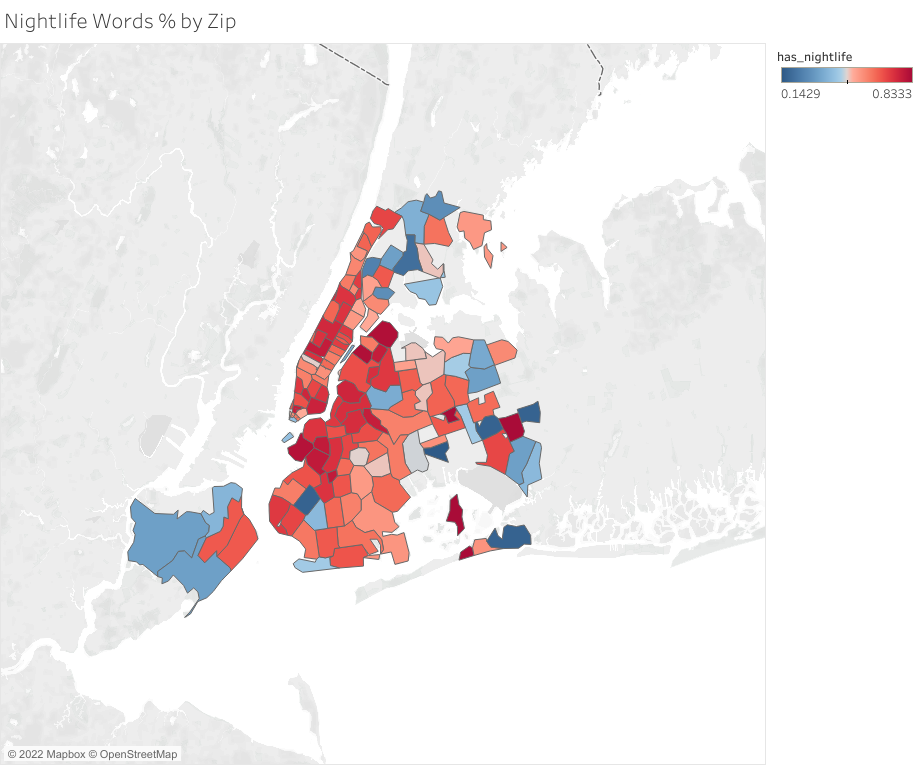

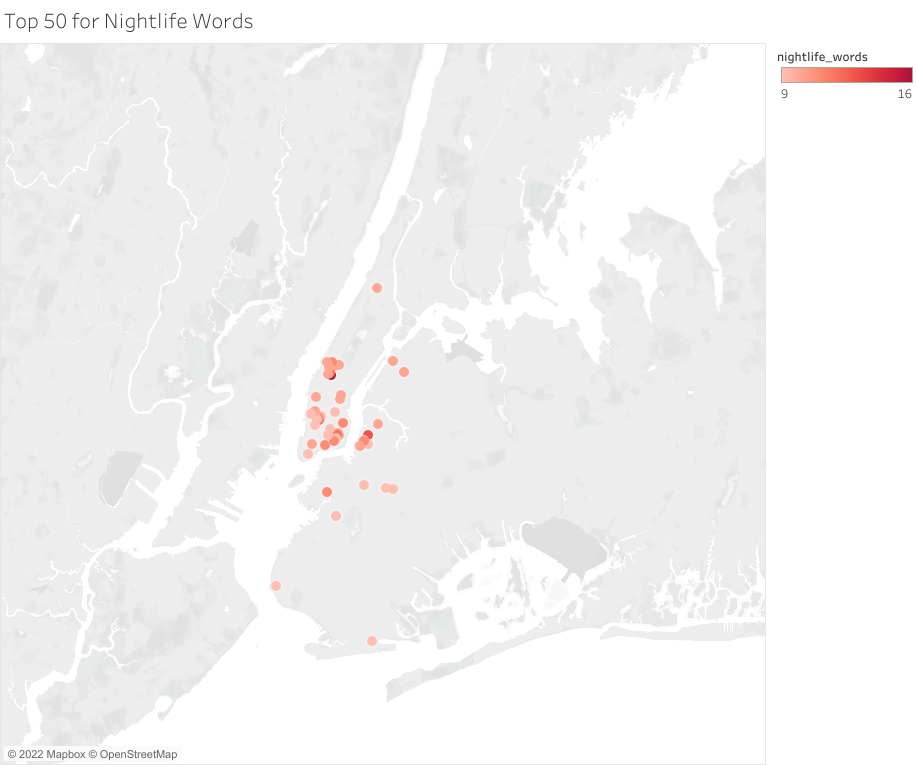

### "Proximity" Words

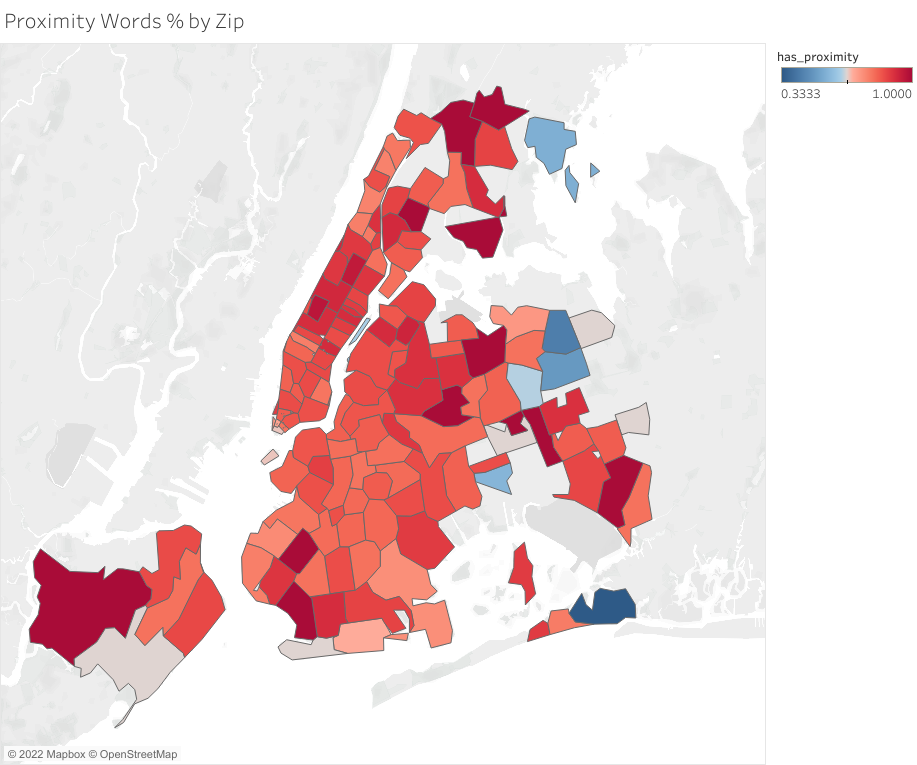

### "Public Transit" Words

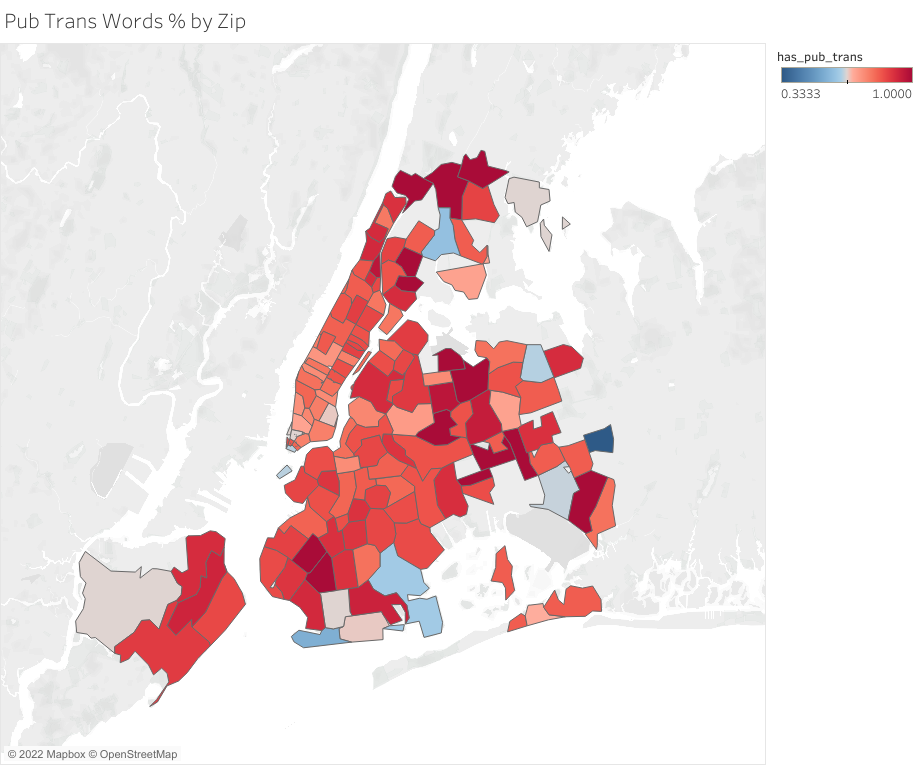

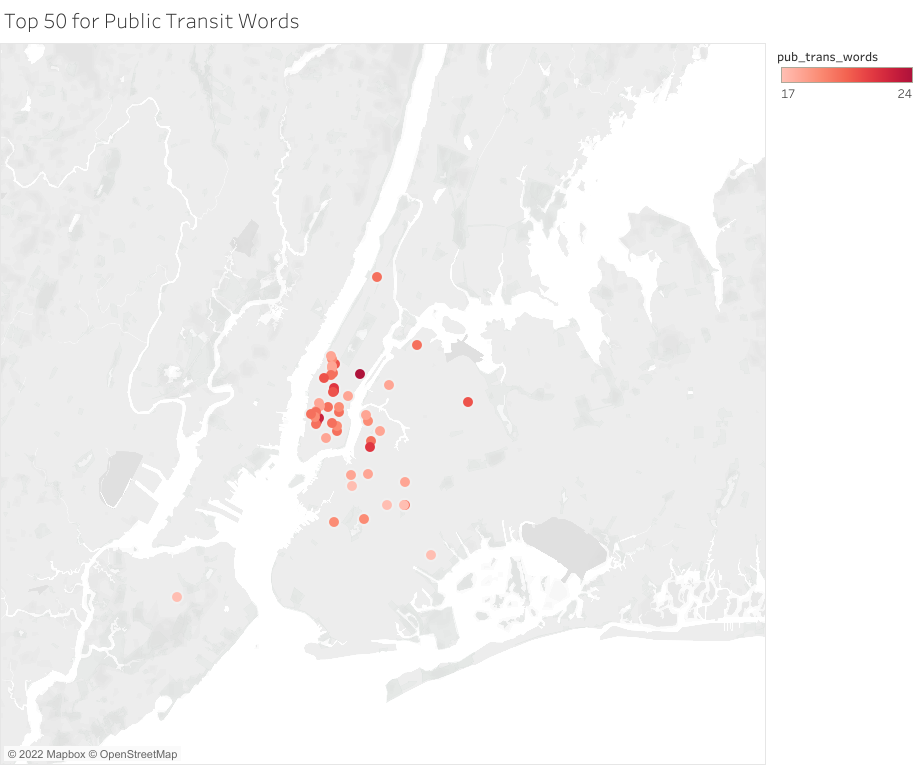

### "Relaxation" Words

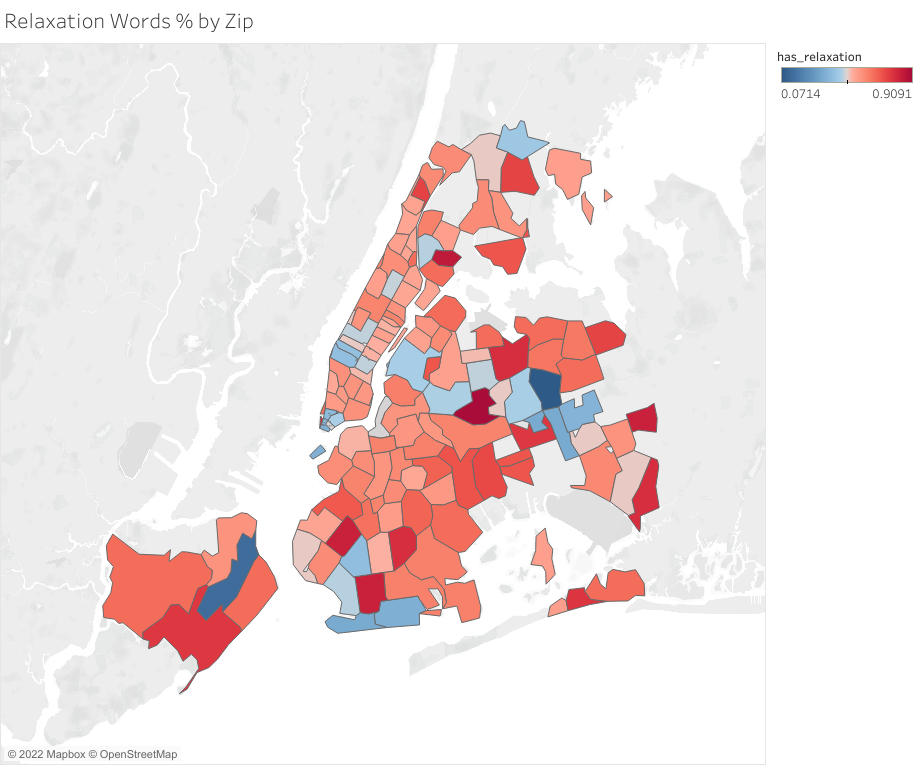

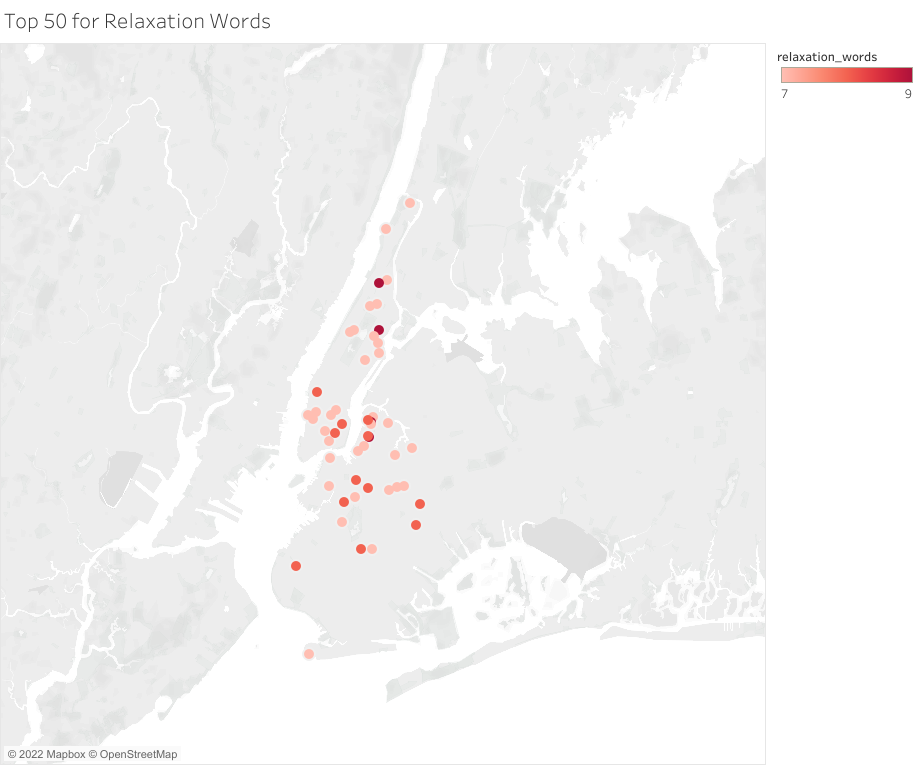

### "Retail" Words

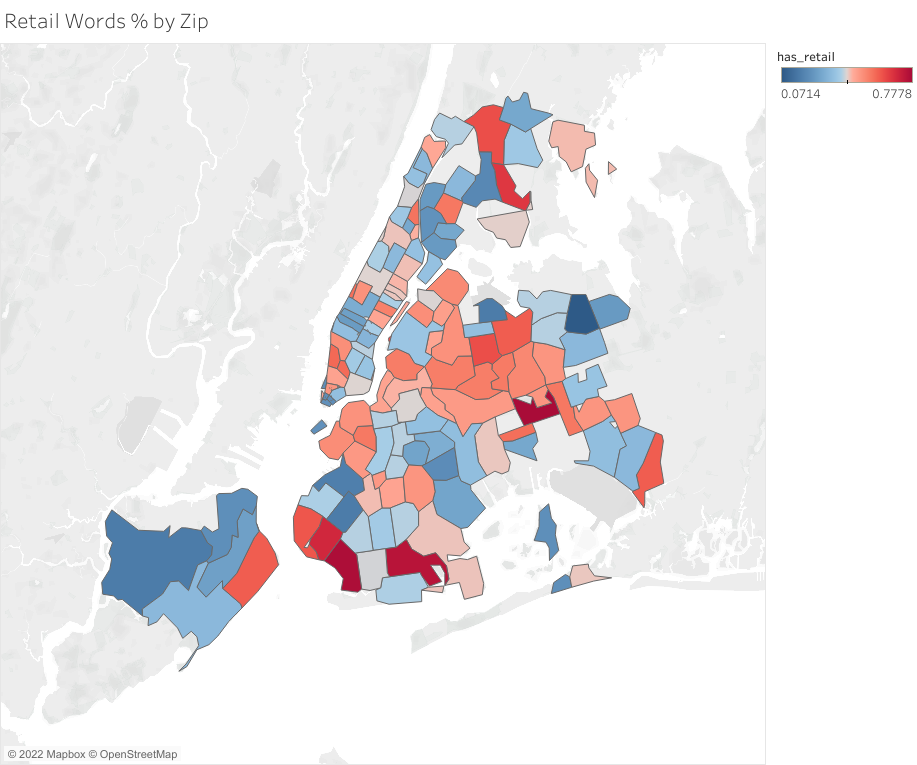

### "Romance" Words

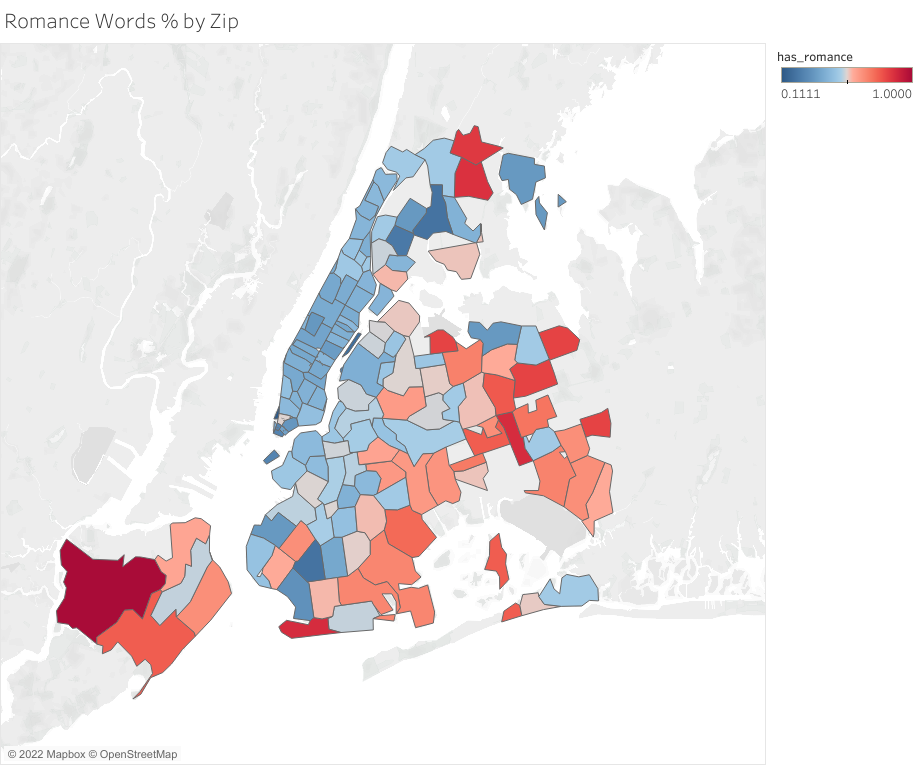

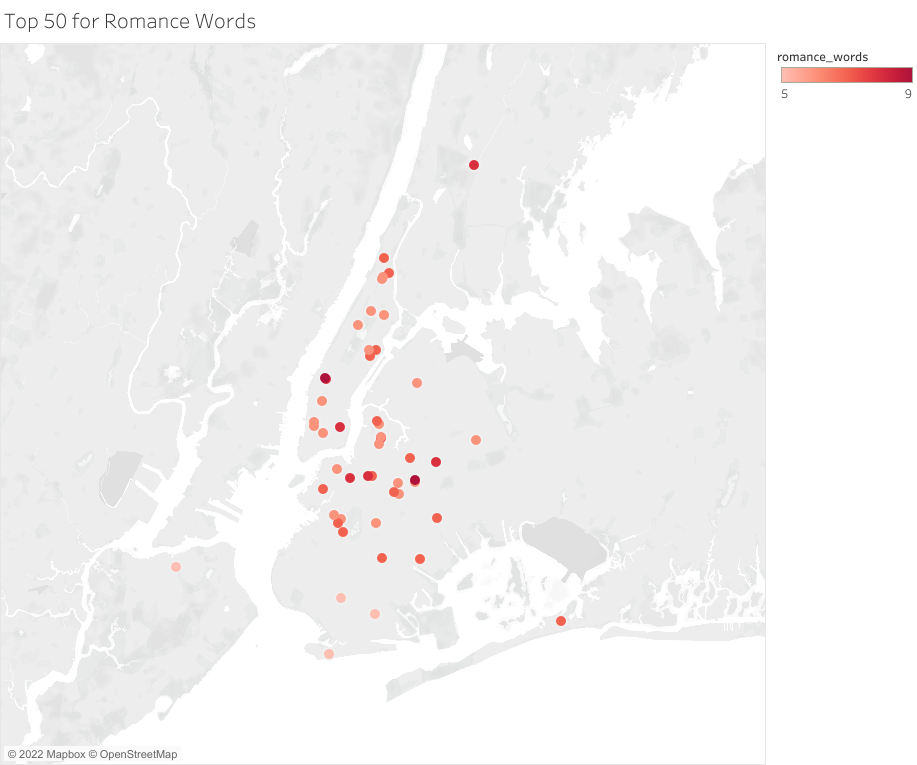

### "Safety" Words

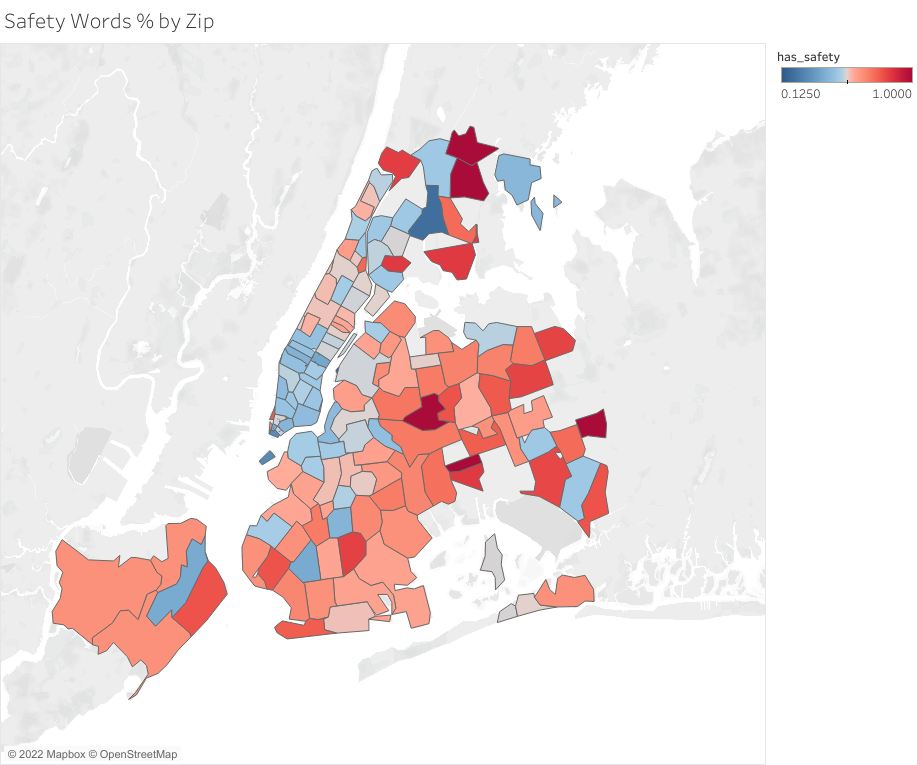

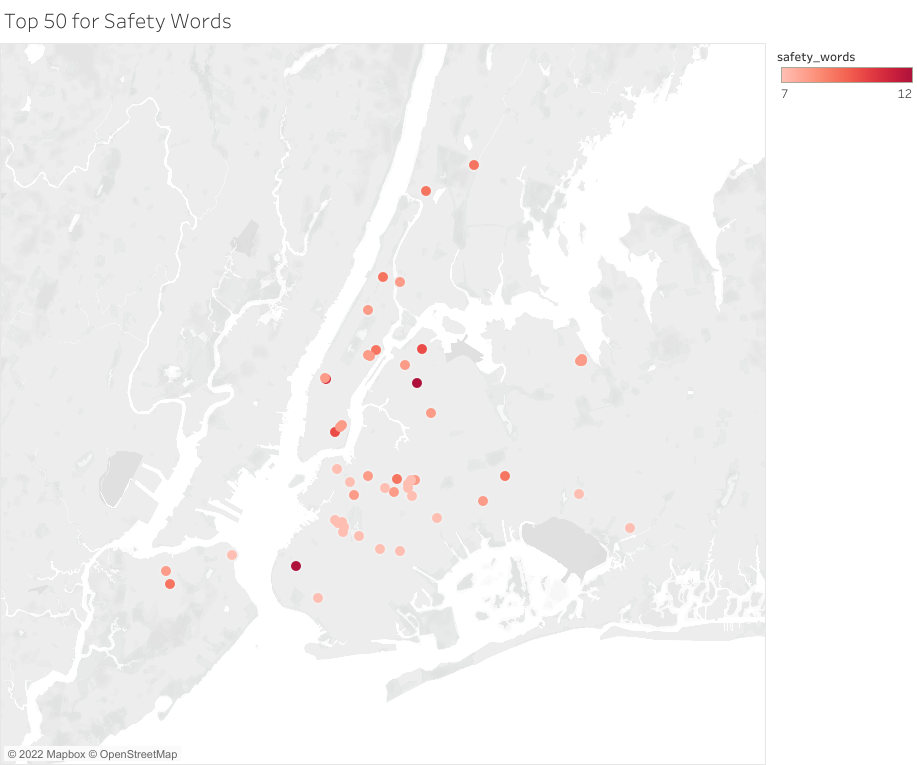

### "Tourism" Words

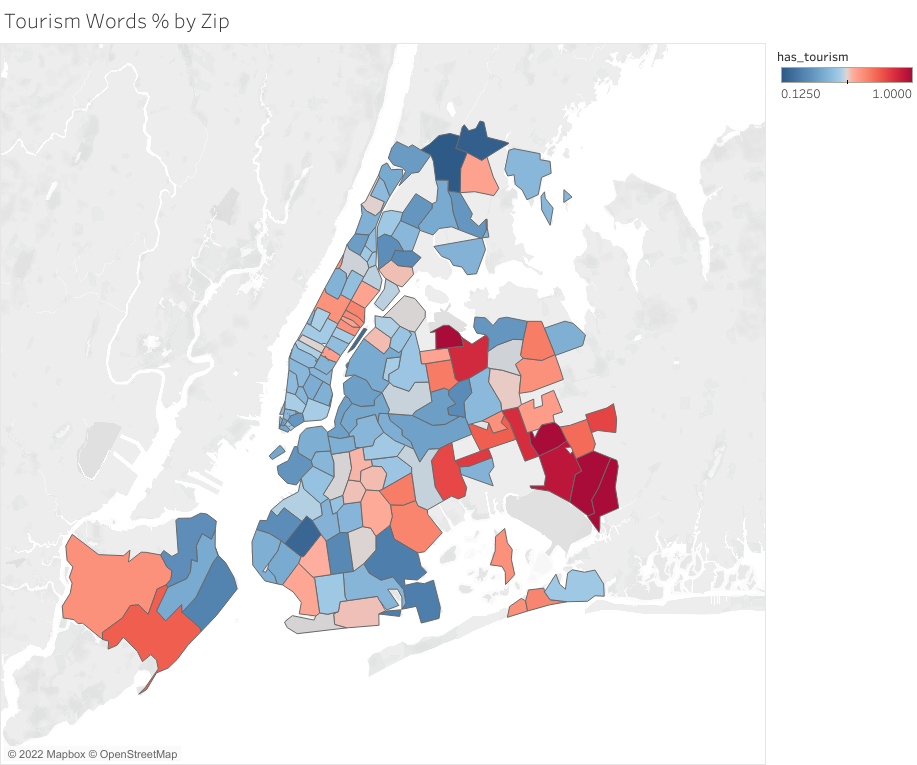

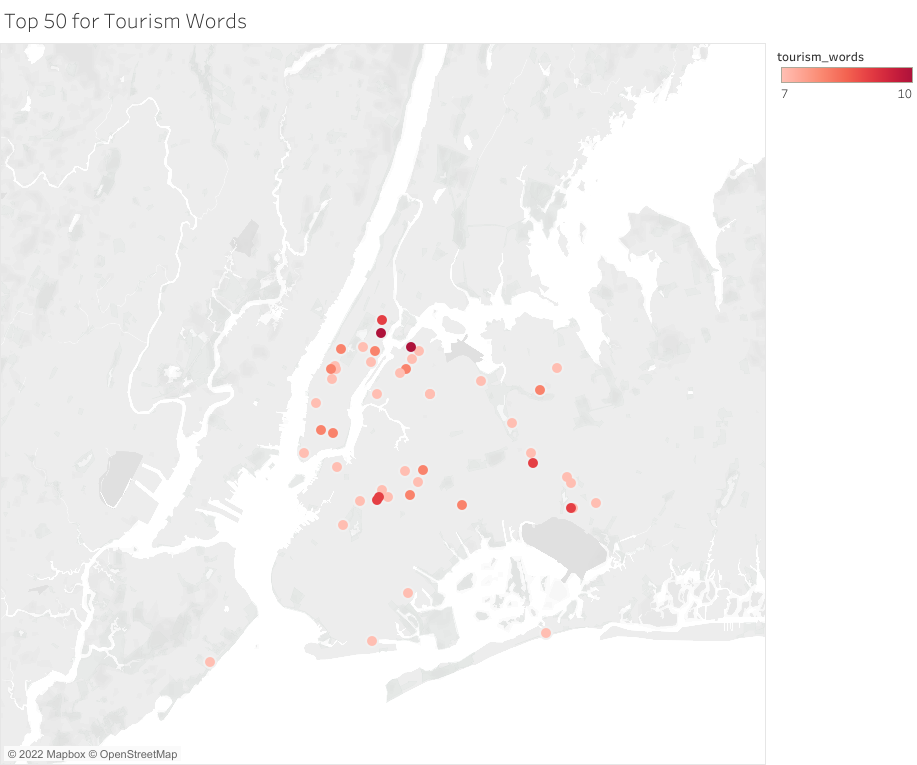

### "Updates" Words

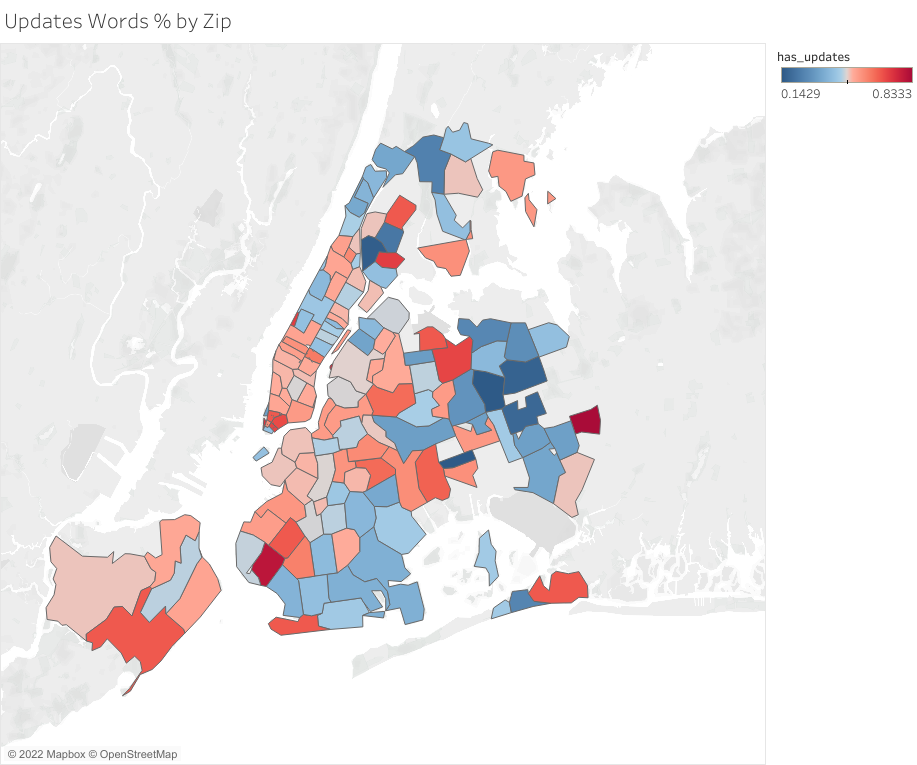

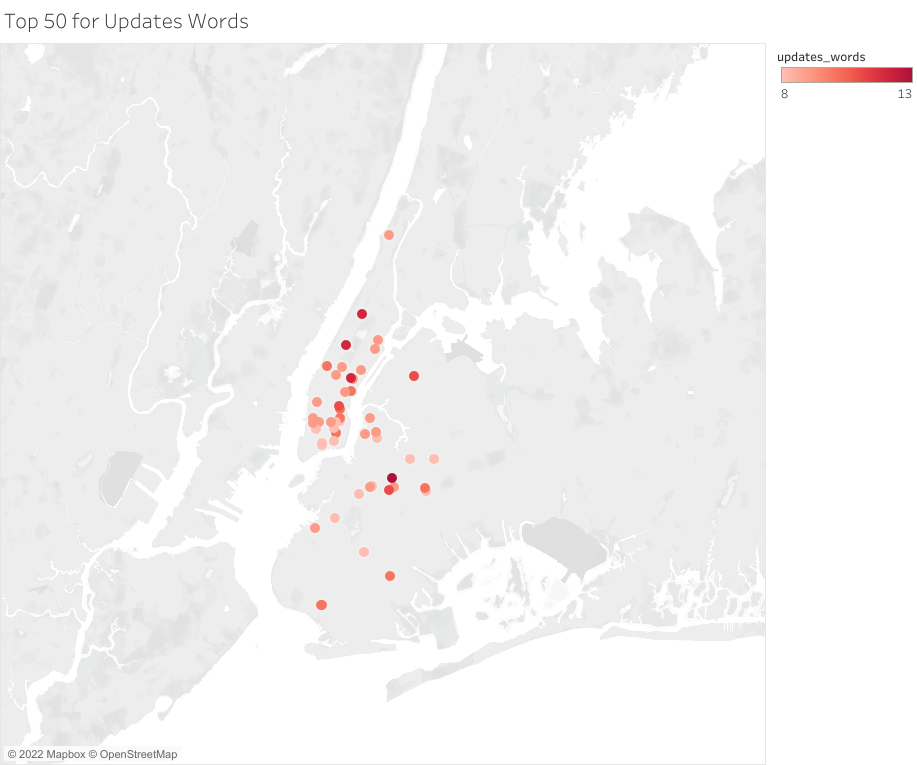

### "Views" Words

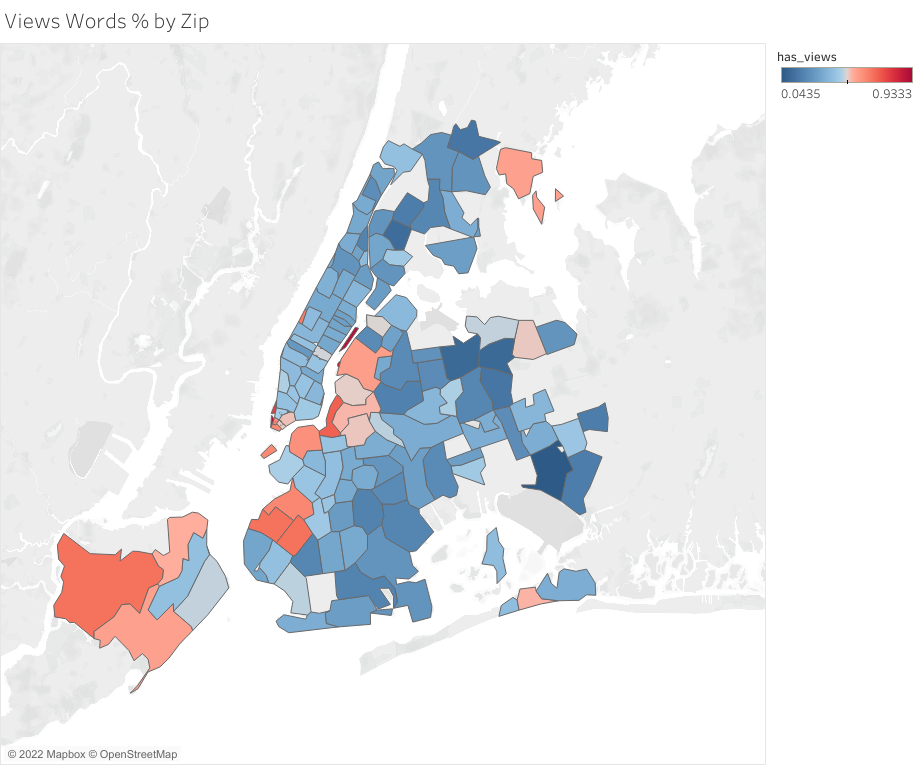

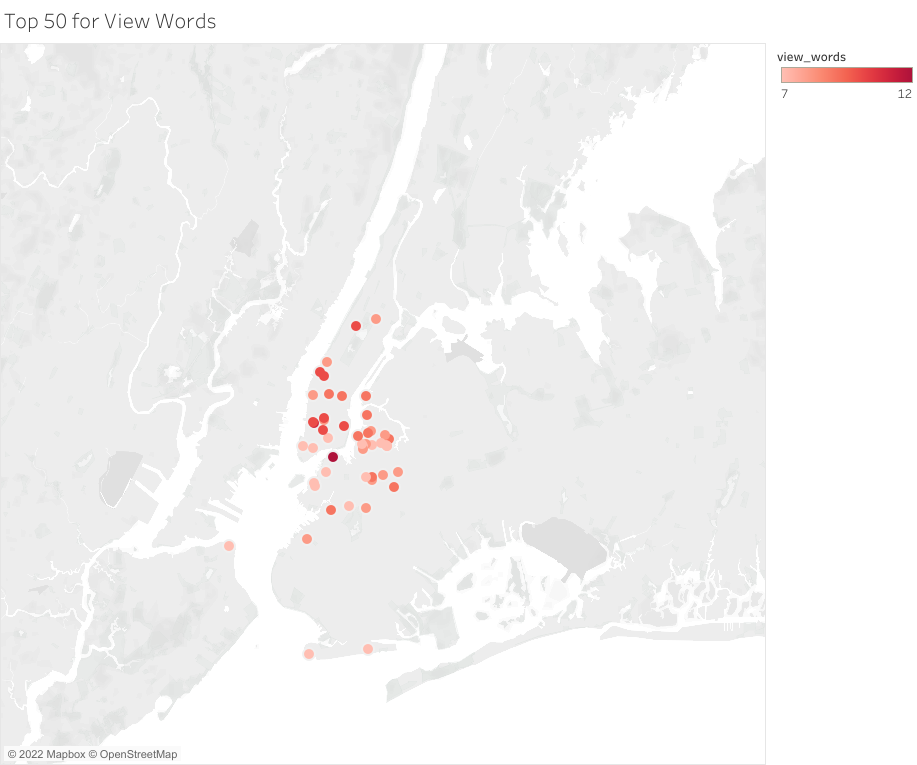

Now that we understand the basic properties of our various measures, it would be helpful to understand how they relate to one another. Using .corr(), we can create a correlation matrix relating each variable to every other one in a large table.

In [355]:
df_corr = df_NYC.corr()
df_corr

,id,log_price,accommodates,bathrooms,cleaning_fee,host_has_profile_pic,host_identity_verified,host_response_rate,instant_bookable,latitude,...,proximity_words,romance_words,luxury_words,culture_words,ease_words,hip_words,history_words,nature_words,retail_words,negative_words
id,1.000000,-0.006876,-0.003690,-0.013029,0.002161,-0.004133,0.003580,-0.002129,0.007729,0.006666,...,-0.016439,-0.006409,0.008577,0.017232,-0.000239,-0.003967,-0.009411,0.006541,0.002728,-0.001666
log_price,-0.006876,1.000000,0.438158,0.441018,0.037783,-0.010575,-0.021337,-0.006286,0.004693,0.098760,...,-0.010975,-0.056834,0.223897,-0.081677,-0.069064,0.031855,0.030970,-0.004907,-0.062943,-0.015530
accommodates,-0.003690,0.438158,1.000000,0.520854,0.130132,0.007466,-0.011683,0.056662,0.118570,-0.066470,...,-0.008118,0.046393,0.087291,-0.004863,-0.028627,0.017673,0.025464,-0.000264,-0.045466,0.001435
bathrooms,-0.013029,0.441018,0.520854,1.000000,0.036351,-0.011597,-0.015073,0.005341,0.004751,-0.068180,...,-0.023959,0.027528,0.124267,-0.037407,-0.032751,0.002881,0.038638,0.067131,-0.046429,-0.016838
cleaning_fee,0.002161,0.037783,0.130132,0.036351,1.000000,-0.000742,0.114604,0.066732,0.006765,-0.044754,...,0.068818,0.080904,0.076371,0.078094,0.071111,0.069054,0.071655,0.072827,0.060025,0.005286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hip_words,-0.003967,0.031855,0.017673,0.002881,0.069054,-0.016277,0.042991,0.005054,0.006791,-0.050074,...,0.041753,0.073619,0.216883,0.208705,0.012188,1.000000,0.094822,0.021892,0.071449,0.029145
history_words,-0.009411,0.030970,0.025464,0.038638,0.071655,-0.004442,0.062899,0.031980,-0.029158,-0.044510,...,0.024090,0.044962,0.185842,0.164100,-0.002850,0.094822,1.000000,0.132910,0.023461,0.000606
nature_words,0.006541,-0.004907,-0.000264,0.067131,0.072827,-0.009676,0.075565,0.036248,-0.053200,-0.090550,...,0.200598,0.076802,0.063918,0.178176,0.133439,0.021892,0.132910,1.000000,0.121340,-0.014300
retail_words,0.002728,-0.062943,-0.045466,-0.046429,0.060025,0.002916,0.017280,-0.002376,-0.030038,-0.009792,...,0.210246,-0.009258,-0.015154,0.158133,0.154865,0.071449,0.023461,0.121340,1.000000,0.009756


Everything we're interested in exists in the above table, but at 84 rows by 84 columns, it's difficult to parse (and can't even fully fit inline in the notebook!).

We can take another tack, however, and by adjusting the code from [this stackexchange page](https://stackoverflow.com/questions/17778394/list-highest-correlation-pairs-from-a-large-correlation-matrix-in-pandas), we can construct a table of variable pairs along with the absolute value of their correlation. We then choose to return it in descending correlation order, and limit the output to the top 50 pairs.

In [1]:
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

The majority of these pairs make intuitive sense as related categories.

Obvious appliance pairs Oven/Stove and Washer/Dryer sit right up at the top, followed by the inextricably linked trio of beds/bedrooms/accommodates.

Other pairings that I think are notable are Elevator/Wheelchair, Luggage/Longterm, and safety_words/relaxation_words. 

87 variables is a large number of variables to attempt to compare to each other graphically, so for the creation of our correlation heatmaps, we'll actually split the data into three different groups: 
- df_text will contain the NLP-produced columns, so desc_length, name_length, # of amenities, and each of our word categories.
- df_base will contain all the non-amenity columns in the base dataset.
- df_amenities will contain all of the dummy variable columns created based on the amenities lists.

In [288]:
df_text = df_NYC[['id', 'log_price', 'desc_length','name_length', '#_of_amenities', 'big_words', 'small_words', 'pub_trans_words', 'landmark_words', 'nightlife_words',  'business_words', 'safety_words', 'view_words', 'updates_words', 'cleanliness_words', 'tourism_words', 'relaxation_words', 'family_words', 'proximity_words', 'romance_words', 'luxury_words', 'culture_words', 'ease_words', 'hip_words', 'history_words', 'nature_words', 'retail_words', 'negative_words']]

In [289]:
df_amenities = df_NYC[['id','log_price', 'AC', 'WiFi', 'Office', 'Kids', 'Washer', 'Dryer', 'Elevator', '24hr', 'BR_Lock', 'Self_CheckIn', 'Pet_Friendly', 'Doorman', 'Private_Ent', 'Stove', 'Oven', 'Gym', 'Lockbox', 'Free_parking', 'Breakfast', 'Wheelchair', 'Pets_on_prop', 'Events', 'Fireplace', 'Dishwasher', 'Hot_tub', 'Long_term', 'Darkening', 'Pets', 'Luggage', 'Smoking', 'Keypad', 'Patio_Balcony', 'Garden_backyard', 'Private_LR', 'Pool', 'Smart lock', 'BBQ grill', 'Crib']]

In [290]:
df_base = df_NYC[['id', 'log_price', 'property_type', 'accommodates', 'bathrooms', 'bed_type', 'cancellation_policy', 'cleaning_fee', 'host_has_profile_pic', 'host_identity_verified', 'host_response_rate', 'instant_bookable', 'latitude', 'longitude', 'neighbourhood', 'number_of_reviews', 'review_scores_rating', 'zipcode', 'bedrooms', 'beds', 'days_since_first_review', 'days_since_host_start', 'has_url']]

In [291]:
# Creating correlation matrices for each of the 3 subset dataframes

df_corr_text = df_text.corr()
df_corr_am = df_amenities.corr()
df_corr_base = df_base.corr()

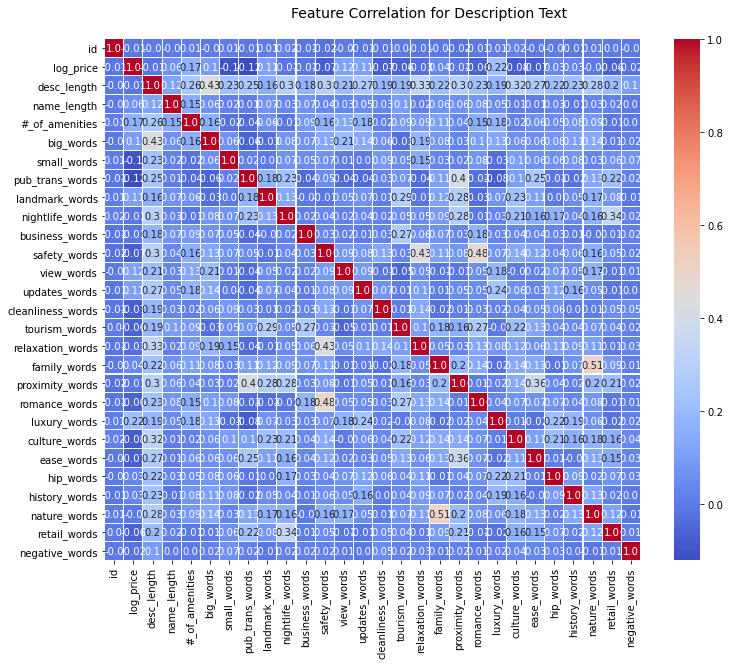

In [292]:
# Creating a correlation heatmap for the NLP text columns
f, ax = plt.subplots(figsize=(12, 9))
hm = sns.heatmap(round(df_corr_text,2), annot=True, ax=ax, cmap="coolwarm", fmt='',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Feature Correlation for Description Text', fontsize=14)

In [293]:
print("Top Absolute Correlations")
print(get_top_abs_correlations(df_corr_text, 25))

Top Absolute Correlations
family_words     nature_words        0.735622
pub_trans_words  proximity_words     0.687056
safety_words     romance_words       0.674239
                 relaxation_words    0.637874
proximity_words  ease_words          0.590749
nightlife_words  retail_words        0.572101
desc_length      big_words           0.527705
pub_trans_words  ease_words          0.480614
nightlife_words  proximity_words     0.456716
pub_trans_words  retail_words        0.436659
                 nightlife_words     0.435303
landmark_words   proximity_words     0.425891
updates_words    luxury_words        0.406784
desc_length      relaxation_words    0.402697
log_price        luxury_words        0.402287
business_words   tourism_words       0.396780
landmark_words   tourism_words       0.384851
proximity_words  retail_words        0.382896
pub_trans_words  luxury_words        0.366782
log_price        pub_trans_words     0.354392
big_words        view_words          0.354173
desc_len

These correlations imply some common-sense overlapping relationships between our various word buckets.
Some examples:
- family_words and nature_words
- safety_words and relaxation_words
- nightlife_words and retail_words
- landmark_words and proximity_words
- updates_words and luxury_words

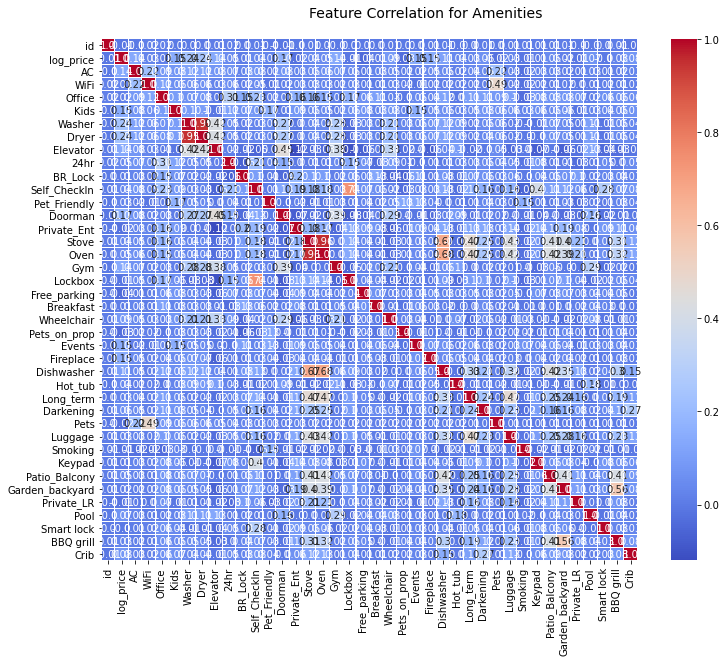

In [294]:
# Creating a correlation heatmap for the amenities list columns

f, ax = plt.subplots(figsize=(12, 9))
hm = sns.heatmap(round(df_corr_am,2), annot=True, ax=ax, cmap="coolwarm", fmt='',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Feature Correlation for Amenities', fontsize=14)

In [295]:
print("Top Absolute Correlations")
print(get_top_abs_correlations(df_corr_am, 50))

Top Absolute Correlations
Stove            Oven               0.999239
Washer           Dryer              0.998734
Oven             Dishwasher         0.924667
Stove            Dishwasher         0.922275
Self_CheckIn     Lockbox            0.882270
Garden_backyard  BBQ grill          0.861236
Long_term        Luggage            0.808841
Stove            Long_term          0.783183
Elevator         Doorman            0.782121
Oven             Long_term          0.778985
WiFi             Pets               0.771240
Patio_Balcony    Garden_backyard    0.756655
Dishwasher       Patio_Balcony      0.754768
Stove            Luggage            0.742626
Patio_Balcony    BBQ grill          0.738874
Oven             Luggage            0.736137
                 Patio_Balcony      0.735726
Stove            Patio_Balcony      0.733359
Doorman          Gym                0.712652
Elevator         Gym                0.710945
Washer           Elevator           0.705119
Dryer            Elevator    

Again, there are some groupings here that make intuitive sense, with Stove+Oven and Washer+Dryer right at the top.

Other notable pairs include:
- Elevator + Wheelchair
- Luggage + Longterm
- Patio/Balcony + Grill
- Doorman + Gym
- Self-CheckIn + Keypad

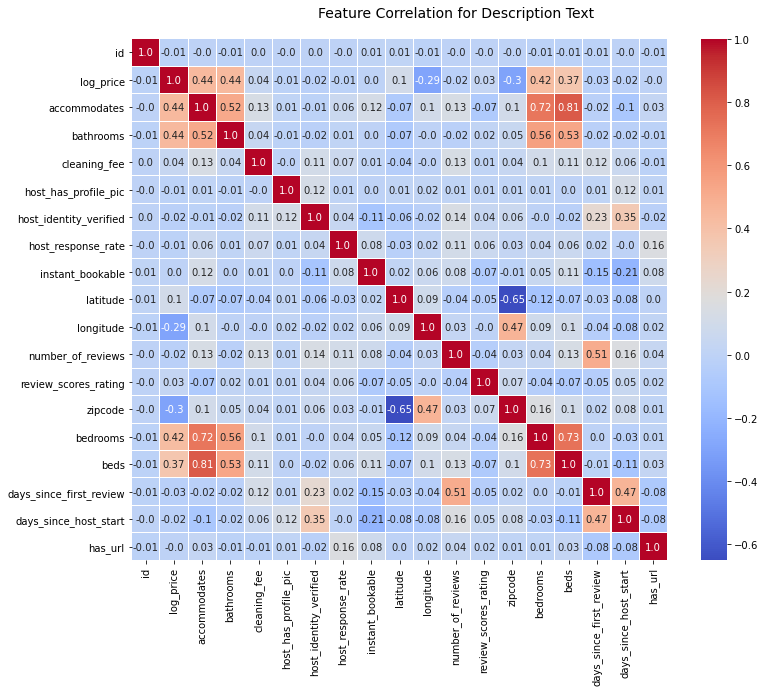

In [296]:
# Creating a correlation heatmap for the NLP text columns

f, ax = plt.subplots(figsize=(12, 9))
hm = sns.heatmap(round(df_corr_base,2), annot=True, ax=ax, cmap="coolwarm", fmt='',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Feature Correlation for Description Text', fontsize=14)

In [297]:
print("Top Absolute Correlations")
print(get_top_abs_correlations(df_corr_base, 25))

Top Absolute Correlations
accommodates             beds                       0.981000
bedrooms                 beds                       0.951231
accommodates             bedrooms                   0.949565
bathrooms                bedrooms                   0.866671
                         beds                       0.835000
accommodates             bathrooms                  0.834938
latitude                 zipcode                    0.834860
log_price                bathrooms                  0.732813
days_since_first_review  days_since_host_start      0.726885
number_of_reviews        days_since_first_review    0.724128
log_price                accommodates               0.678608
                         bedrooms                   0.667167
                         beds                       0.640940
host_identity_verified   days_since_host_start      0.617275
longitude                zipcode                    0.615976
log_price                longitude                  0.54218

Most of the top correlation pairs revolve around the # accommodated and the # of beds, bedrooms, and bathrooms, which makes good sense.

We also see that log_price is correlated somewhat strongly with Latitude and Longitude, as well as with # of bedrooms and bathrooms.

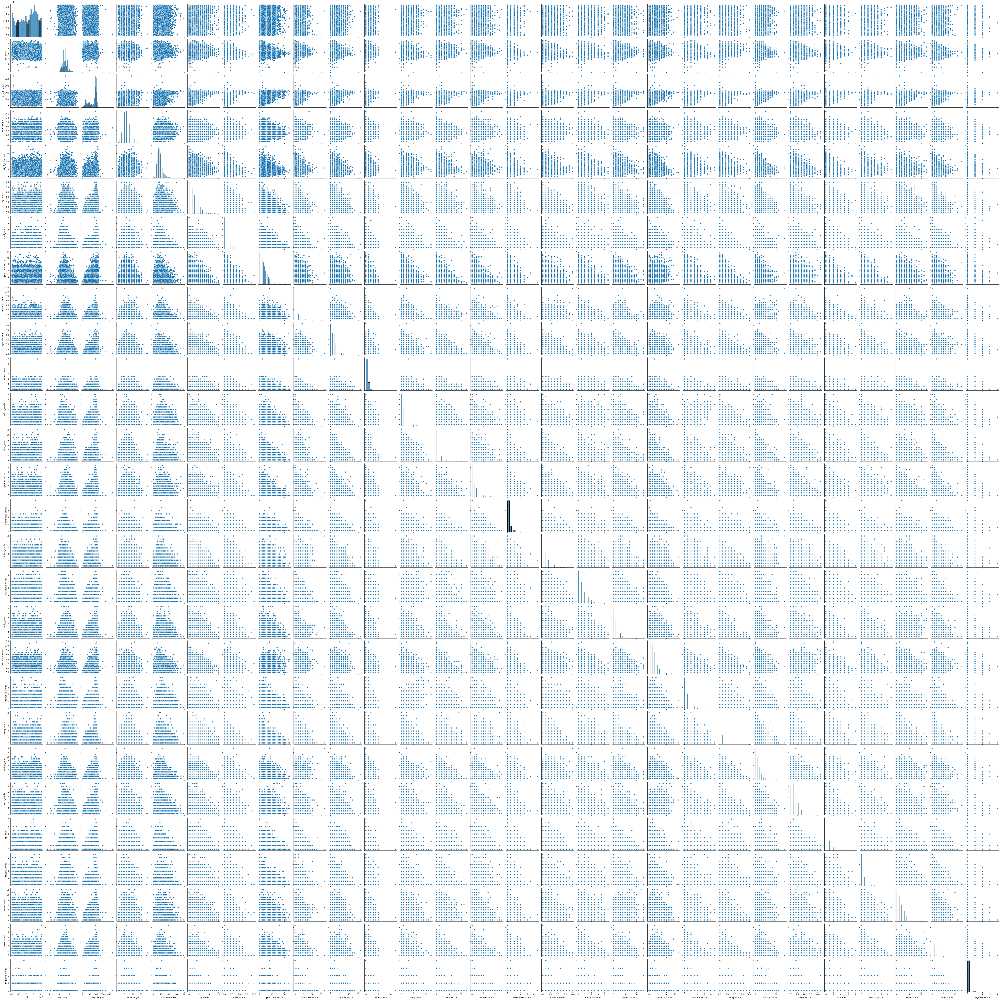

In [299]:
# Creating a pairplot for all remaining variables
sns.pairplot(df_text, palette='Set1')
plt.show()

In [350]:
df_NYC.to_csv('D:/Springboard/ThirdCapstone/RawData/EDA_df.csv', index=False)

Now that our Exploratory Data Analysis is complete, we can move on to preprocessing our data for cluster modeling.